Number of images in training set:  7128
Number of masks in training set:  7128
Number of images in testing set:  891
Number of masks in testing set:  891
steps_per_epoch:  223
validation_steps:  28
Training model: resnet_unet
Found 7128 images belonging to 1 classes.
Found 7128 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
222/222 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step - accuracy: 0.8801 - dice_coef: 0.4332 - loss: 0.5131
Epoch 2: val_loss did not improve from 2.25934
222/222 ━━━━━━━━━━━━━━━━━━━━ 84s 273ms/step - accuracy: 0.8801 - dice_coef: 0.4332 - loss: 0.5130 - val_accuracy: 0.1767 - val_dice_coef: 0.2312 - val_loss: 3.6573 - learning_rate: 9.4406e-05

Epoch 3: LearningRateScheduler setting learning rate to 8.912509381337456e-05.
Epoch 3/20
222/222 ━━━━━━━━━━━━━━━━━━━━ 0s 245ms/step - accuracy: 0.9076 - dice_coef: 0.4538 - loss: 0.4120
Epoch 3: val_loss did not improve from 2.25934
222/222 ━━━━━━━━━━━━━━━━━━━━ 61s 273ms/step

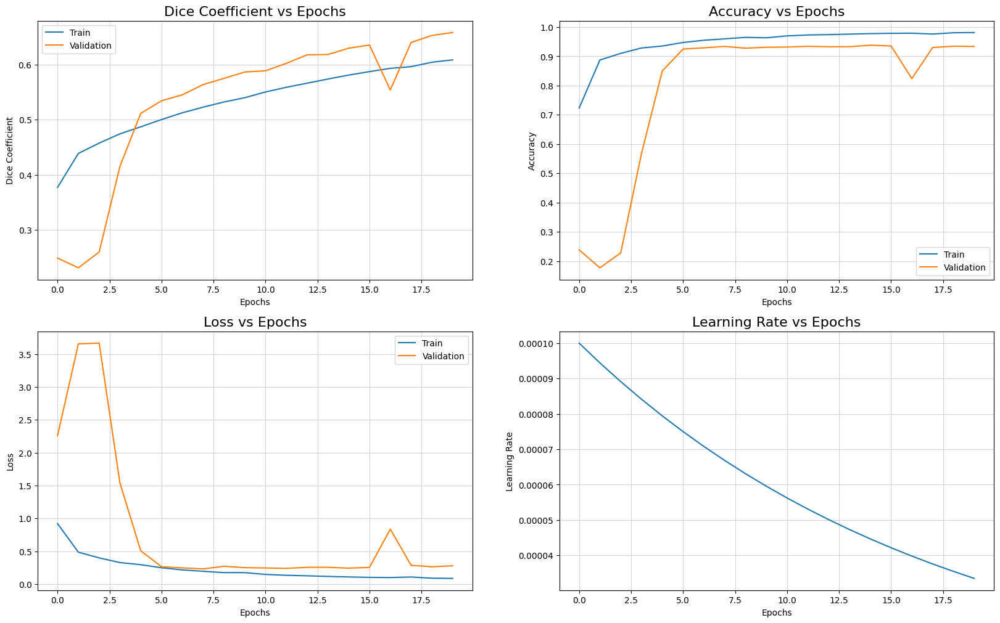

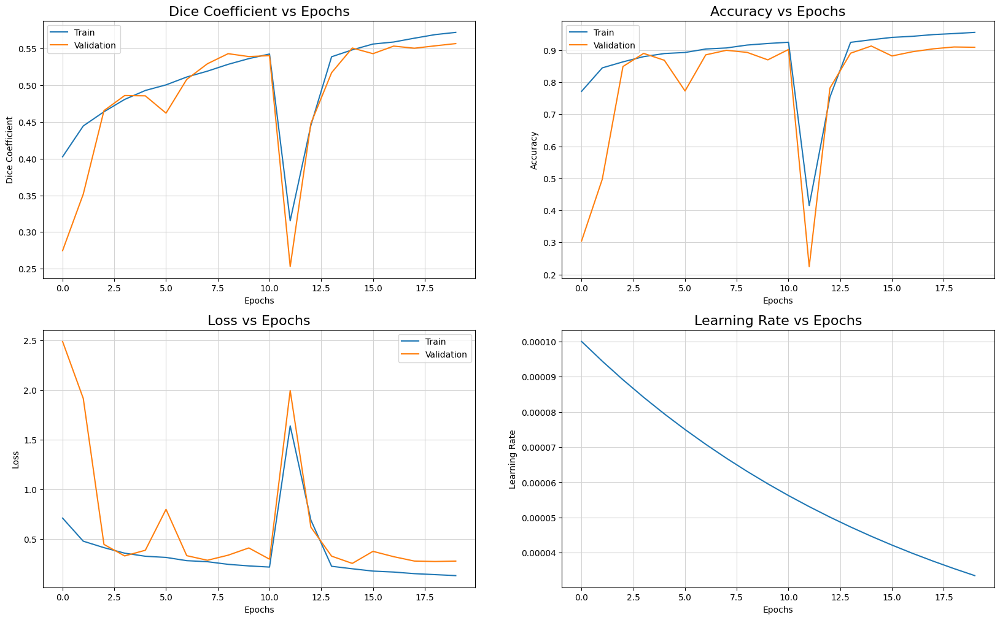

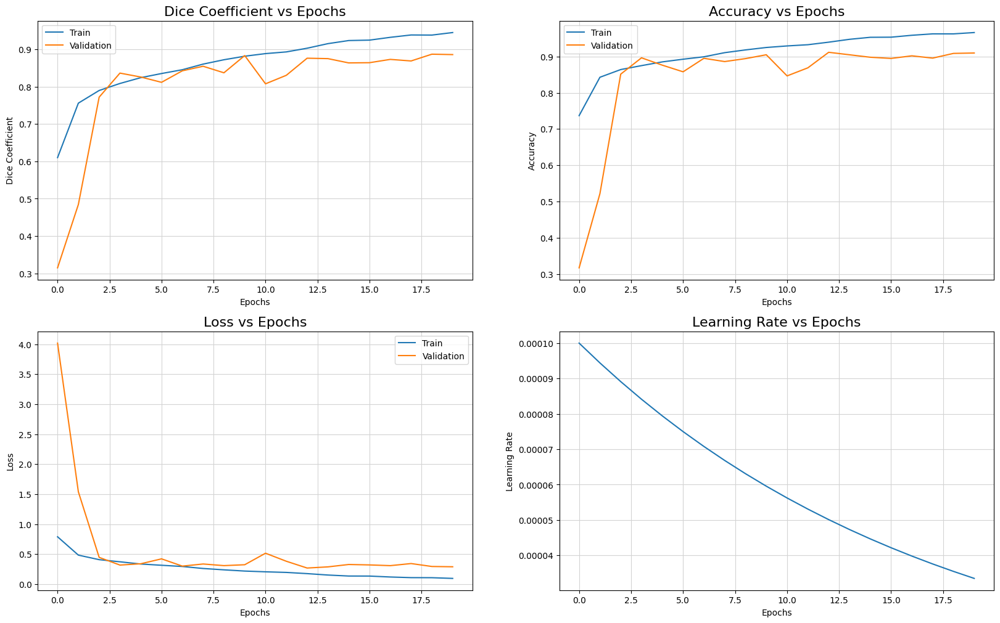

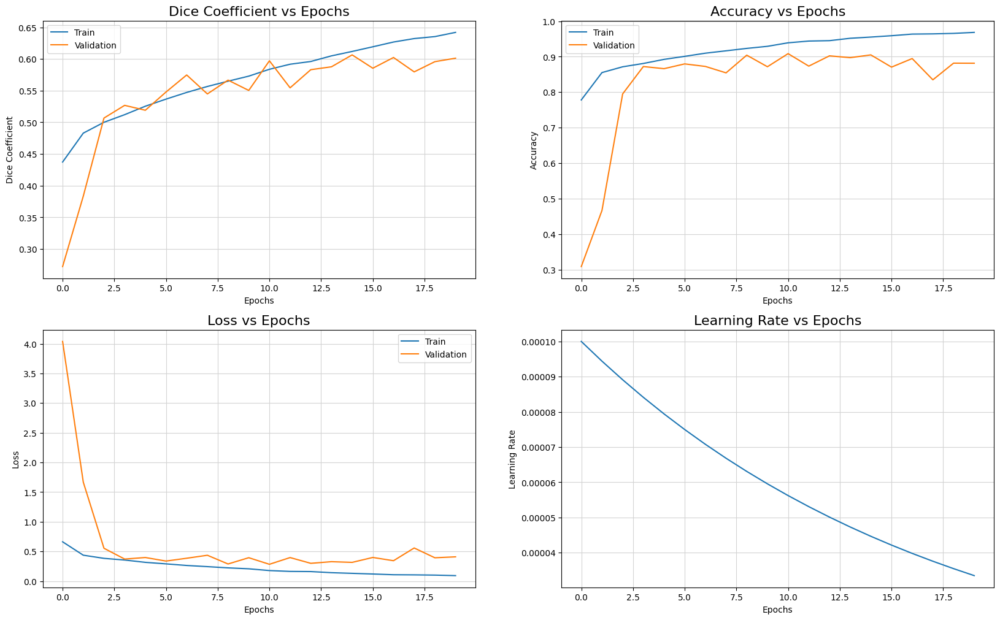

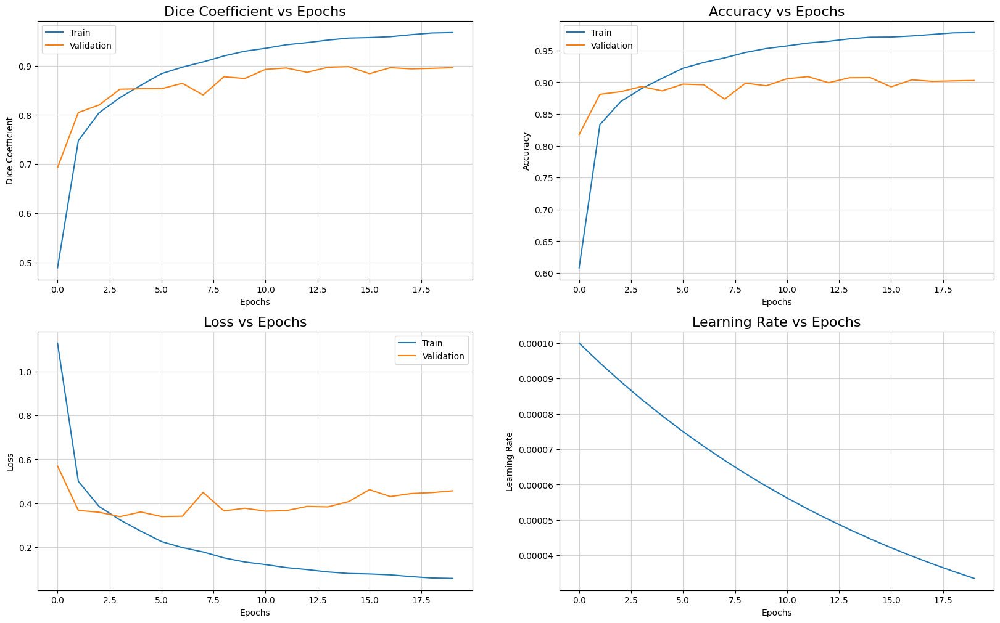

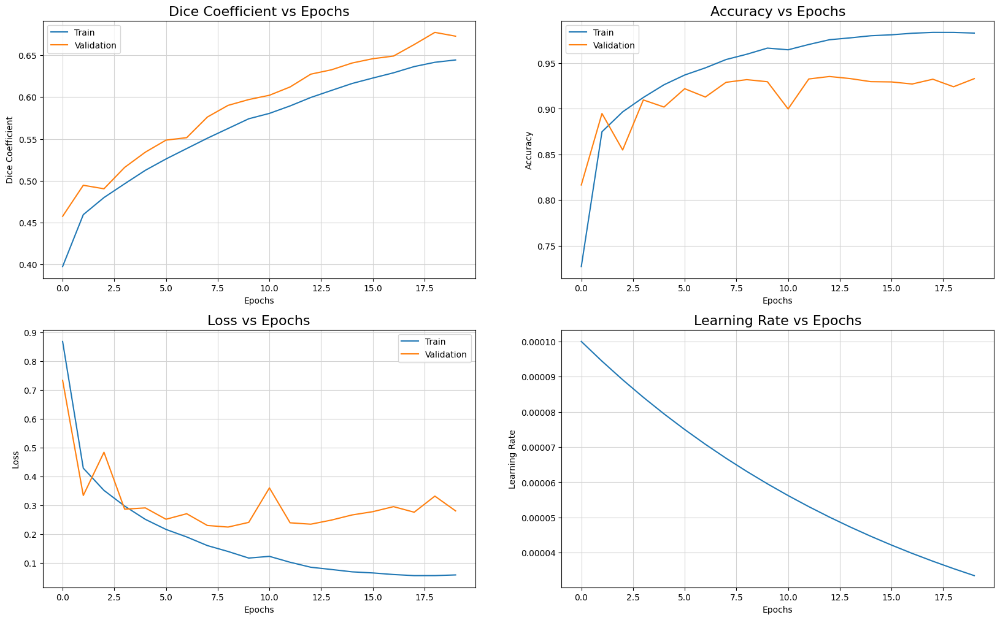

In [2]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger, LearningRateScheduler
import matplotlib.pyplot as plt
import pickle
import pandas as pd
import albumentations as A
import seaborn as sns
from PIL import Image, ImageFont
from collections import defaultdict
import random, shutil, cv2
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16, DenseNet121, InceptionResNetV2, VGG19, ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler, TensorBoard
from tensorflow.keras.layers import *




import numpy as np
import pandas as pd
import albumentations as A
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageFont
from collections import defaultdict
import os, re, sys, random, shutil, cv2
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow import keras
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import VGG16, DenseNet121, InceptionResNetV2, VGG19
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger
from tensorflow.keras.layers import *

import pickle
import numpy as np
import pandas as pd
import albumentations as A
# from IPython.display import SVG #unnecessary
import matplotlib.pyplot as plt
# %matplotlib inline  # Removed as it's specific to IPython environments
import seaborn as sns
from PIL import Image, ImageFont
from collections import defaultdict
import os, re, sys, random, shutil, cv2

import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import VGG16, DenseNet121, InceptionResNetV2 ,VGG19 # Removed VGG16, unnecessary imports
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
# from tensorflow.keras.utils import model_to_dot, plot_model # unnecessary
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler, TensorBoard
from tensorflow.keras.layers import *

# Data directories - ADJUST THESE TO YOUR ACTUAL DIRECTORY STRUCTURE
data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"  #Example path you should modify for your dataset
train_images = f"{data_dir}train_images/"
train_masks = f"{data_dir}train_masks/"
val_images = f"{data_dir}val_images/"
val_masks = f"{data_dir}val_masks/"
test_images = f"{data_dir}test_images/"
test_masks = f"{data_dir}test_masks/"

# Check if directories exist, if not assume working directory
if not os.path.exists(train_images):
    train_images = "train_images/"  # Adjust to relative or absolute path
if not os.path.exists(train_masks):
    train_masks = "train_masks/"
if not os.path.exists(val_images):
    val_images = "val_images/"
if not os.path.exists(val_masks):
    val_masks = "val_images/"
if not os.path.exists(test_images):
    test_images = "test_images/"
if not os.path.exists(test_masks):
    test_masks = "test_masks/"

print('Number of images in training set: ', len(os.listdir(os.path.join(train_images,'train')) if os.path.exists(os.path.join(train_images,'train')) else "Train images directory not found.") )
print('Number of masks in training set: ', len(os.listdir(os.path.join(train_masks,'train')) if os.path.exists(os.path.join(train_masks,'train')) else "Train masks directory not found.") )

print('Number of images in testing set: ', len(os.listdir(os.path.join(test_images,'test')) if os.path.exists(os.path.join(test_images,'test')) else "Test images directory not found."))
print('Number of masks in testing set: ', len(os.listdir(os.path.join(test_masks,'test')) if os.path.exists(os.path.join(test_masks,'test')) else "Test masks directory not found."))


class_dict_df = pd.read_csv(f'{data_dir}class_dict.csv', index_col=False, skipinitialspace=True)
class_dict_df


label_names= list(class_dict_df.name)
label_codes = []
r= np.asarray(class_dict_df.r)
g= np.asarray(class_dict_df.g)
b= np.asarray(class_dict_df.b)

for i in range(len(class_dict_df)):
    label_codes.append(tuple([r[i], g[i], b[i]]))

label_codes, label_names

code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}








def rgb_to_onehot(rgb_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs:
            rgb_image - image matrix (eg. 256 x 256 x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,)
    encoded_image = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(colormap):
        encoded_image[:,:,i] = np.all(rgb_image.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image

def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs:
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3)
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)
test_frames_datagen = ImageDataGenerator(**data_gen_args)
test_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

TARGET_SIZE = (128, 128) # Define a constant for target size
BATCH_SIZE = 32

def TrainAugmentGenerator(train_images_dir, train_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = TARGET_SIZE):
    '''Train Image data generator
        Inputs:
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            train_images_dir - train images directory
            train_masks_dir - train masks directory
            target_size - tuple of integers (height, width)

        Output: Decoded RGB image (height x width x 3)
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(
    train_images_dir,
    batch_size = batch_size,
    seed = seed,
    target_size = target_size,
    class_mode=None) # Added class_mode=None

    train_mask_generator = train_masks_datagen.flow_from_directory(
    train_masks_dir,
    batch_size = batch_size,
    seed = seed,
    target_size = target_size,
    class_mode=None) # Added class_mode=None

    while True:
        X1i = next(train_image_generator)
        X2i = next(train_mask_generator)

        # One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])] #fixed indexing

        yield X1i, np.asarray(mask_encoded)

def ValAugmentGenerator(val_images_dir, val_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = TARGET_SIZE):
    '''Validation Image data generator
        Inputs:
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            val_images_dir - validation images directory
            val_masks_dir - validation masks directory
            target_size - tuple of integers (height x width)

        Output: Decoded RGB image (height x width x 3)
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    val_images_dir,
    batch_size = batch_size,
    seed = seed,
    target_size = target_size,
    class_mode=None) # Added class_mode=None

    val_mask_generator = val_masks_datagen.flow_from_directory(
    val_masks_dir,
    batch_size = batch_size,
    seed = seed,
    target_size = target_size,
    class_mode=None) # Added class_mode=None

    while True:
        X1i = next(val_image_generator)
        X2i = next(val_mask_generator)

        # One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])]  #fixed indexing

        yield X1i, np.asarray(mask_encoded)

def TestAugmentGenerator(test_images_dir, test_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = TARGET_SIZE):
    '''Testing Image data generator
        Inputs:
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height x width)

        Output: Decoded RGB image (height x width x 3)
    '''
    test_image_generator = test_frames_datagen.flow_from_directory(
    test_images_dir,
    batch_size = batch_size,
    seed = seed,
    target_size = target_size,
    class_mode=None) # Added class_mode=None

    test_mask_generator = test_masks_datagen.flow_from_directory(
    test_masks_dir,
    batch_size = batch_size,
    seed = seed,
    target_size = target_size,
    class_mode=None) # Added class_mode=None

    while True:
        X1i = next(test_image_generator)
        X2i = next(test_mask_generator)

        # One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])]  #fixed indexing

        yield X1i, np.asarray(mask_encoded)

num_train_samples = len(np.sort(os.listdir(os.path.join(train_images,'train')))) if os.path.exists(os.path.join(train_images,'train')) else 0
num_val_samples = len(np.sort(os.listdir(os.path.join(val_images,'val')))) if os.path.exists(os.path.join(val_images,'val')) else 0
steps_per_epoch = int(np.ceil(float(num_train_samples) / float(BATCH_SIZE))) if num_train_samples > 0 else 0
print('steps_per_epoch: ', steps_per_epoch)
validation_steps = int(np.ceil(float(num_val_samples) / float(BATCH_SIZE))) if num_val_samples > 0 else 0
print('validation_steps: ', validation_steps)

def dice_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)

# Define learning rate scheduler
def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1**(epoch / s)
    return exponential_decay_fn

# Plot training history
def plot_training_history(history, model_name):
    fig, ax = plt.subplots(2, 2, figsize=(20, 12))
    ax = ax.ravel()
    metrics = ['Dice Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

    for i, met in enumerate(['dice_coef', 'accuracy', 'loss', 'lr']):
        if met != 'lr':
            ax[i].plot(history.history[met], '-')
            ax[i].plot(history.history['val_' + met], '-')
            ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
            ax[i].set_xlabel('Epochs')
            ax[i].set_ylabel(metrics[i])
            ax[i].legend(['Train', 'Validation'])
            ax[i].xaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
            ax[i].yaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
        else:
            # Calculate learning rates from your exponential decay function
            lrs = [exponential_decay(0.0001, 40)(epoch) for epoch in range(len(history.history['loss']))]
            ax[i].plot(lrs, '-')
            ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
            ax[i].set_xlabel('Epochs')
            ax[i].set_ylabel(metrics[i])
            ax[i].xaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
            ax[i].yaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")

    plt.savefig(f'{model_name}_metrics_plot.png', facecolor='w', transparent=False, bbox_inches='tight', dpi=300)

# Function to compile and train model
def compile_and_train_model(model, model_name, train_gen, val_gen, steps_per_epoch, validation_steps, epochs):
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=[dice_coef, "accuracy"])

    # Callbacks
    checkpoint = ModelCheckpoint(filepath=f'{model_name}.keras', save_best_only=True, monitor='val_loss', mode='auto', verbose=1)
    csvlogger = CSVLogger(filename=f"{model_name}_training.csv", separator=",", append=False)
    lr_scheduler = LearningRateScheduler(exponential_decay(0.0001, 40), verbose=1)

    callbacks = [checkpoint, csvlogger, lr_scheduler]

    # Train the model
    history = model.fit(
        train_gen,
        steps_per_epoch=steps_per_epoch,
        validation_data=val_gen,
        validation_steps=validation_steps,
        epochs=epochs,
        callbacks=callbacks,
        verbose=1
    )
    return history

def dice_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)


def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)  # Key: strides=2 for correct upsampling
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

# ----------------------------------------------------------------------------
# 1. Standard U-Net
def build_unet(input_shape, num_classes):
    inputs = Input(input_shape)

    # Encoder
    conv1 = conv_block(inputs, 64)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = conv_block(pool1, 128)
    pool2 = MaxPooling2D((2, 2))(conv2)

    conv3 = conv_block(pool2, 256)
    pool3 = MaxPooling2D((2, 2))(conv3)

    conv4 = conv_block(pool3, 512)
    pool4 = MaxPooling2D((2, 2))(conv4)

    # Bridge
    conv5 = conv_block(pool4, 1024)

    # Decoder
    up6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    up6 = Concatenate()([up6, conv4])
    conv6 = conv_block(up6, 512)

    up7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = Concatenate()([up7, conv3])
    conv7 = conv_block(up7, 256)

    up8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = Concatenate()([up8, conv2])
    conv8 = conv_block(up8, 128)

    up9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = Concatenate()([up9, conv1])
    conv9 = conv_block(up9, 64)

    # Output
    outputs = Conv2D(num_classes, 1, activation='sigmoid', padding='same')(conv9)  # Or softmax for multi-class
    model = Model(inputs=inputs, outputs=outputs)
    return model

# ----------------------------------------------------------------------------
# ======================
# ATTENTION U-NET FIXED
# ======================

def attention_block(x, skip):
    """Modified attention block using pure Keras layers"""
    g = Conv2D(x.shape[-1], kernel_size=1)(skip)
    g = BatchNormalization()(g)
    
    x_conv = Conv2D(x.shape[-1], kernel_size=1)(x)
    x_conv = BatchNormalization()(x_conv)
    
    # Use Keras Add layer instead of tf.add
    add = Add()([g, x_conv])
    psi = Activation('relu')(add)
    
    psi = Conv2D(1, kernel_size=1)(psi)
    psi = BatchNormalization()(psi)
    psi = Activation('sigmoid')(psi)
    
    return Multiply()([x, psi])

def build_attention_unet(input_shape, num_classes):
    inputs = Input(input_shape)

    # ========== ENCODER ==========
    # Block 1
    conv1 = Conv2D(64, 3, padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Activation('relu')(conv1)
    conv1 = Conv2D(64, 3, padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    conv1 = Activation('relu')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    # Block 2
    conv2 = Conv2D(128, 3, padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Activation('relu')(conv2)
    conv2 = Conv2D(128, 3, padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    conv2 = Activation('relu')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    # Block 3
    conv3 = Conv2D(256, 3, padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Activation('relu')(conv3)
    conv3 = Conv2D(256, 3, padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    conv3 = Activation('relu')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    # Block 4
    conv4 = Conv2D(512, 3, padding='same')(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Activation('relu')(conv4)
    conv4 = Conv2D(512, 3, padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Activation('relu')(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4)

    # ========== BRIDGE ==========
    bridge = Conv2D(1024, 3, padding='same')(pool4)
    bridge = BatchNormalization()(bridge)
    bridge = Activation('relu')(bridge)
    bridge = Conv2D(1024, 3, padding='same')(bridge)
    bridge = BatchNormalization()(bridge)
    bridge = Activation('relu')(bridge)

    # ========== DECODER WITH ATTENTION ==========
    # Decoder Block 1
    up1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bridge)
    attn1 = attention_block(up1, conv4)
    concat1 = Concatenate()([attn1, up1])
    conv5 = Conv2D(512, 3, padding='same')(concat1)
    conv5 = BatchNormalization()(conv5)
    conv5 = Activation('relu')(conv5)
    conv5 = Conv2D(512, 3, padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Activation('relu')(conv5)

    # Decoder Block 2
    up2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv5)
    attn2 = attention_block(up2, conv3)
    concat2 = Concatenate()([attn2, up2])
    conv6 = Conv2D(256, 3, padding='same')(concat2)
    conv6 = BatchNormalization()(conv6)
    conv6 = Activation('relu')(conv6)
    conv6 = Conv2D(256, 3, padding='same')(conv6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Activation('relu')(conv6)

    # Decoder Block 3
    up3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6)
    attn3 = attention_block(up3, conv2)
    concat3 = Concatenate()([attn3, up3])
    conv7 = Conv2D(128, 3, padding='same')(concat3)
    conv7 = BatchNormalization()(conv7)
    conv7 = Activation('relu')(conv7)
    conv7 = Conv2D(128, 3, padding='same')(conv7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Activation('relu')(conv7)

    # Decoder Block 4
    up4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7)
    attn4 = attention_block(up4, conv1)
    concat4 = Concatenate()([attn4, up4])
    conv8 = Conv2D(64, 3, padding='same')(concat4)
    conv8 = BatchNormalization()(conv8)
    conv8 = Activation('relu')(conv8)
    conv8 = Conv2D(64, 3, padding='same')(conv8)
    conv8 = BatchNormalization()(conv8)
    conv8 = Activation('relu')(conv8)

    # ========== OUTPUT LAYER ==========
    outputs = Conv2D(num_classes, 1, activation='softmax')(conv8)

    model = Model(inputs=inputs, outputs=outputs, name='Attention-UNet')
    return model




# ----------------------------------------------------------------------------
# 3. U-Net++

def conv_block_nested(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

def build_unet_plus_plus(input_shape, num_classes, deep_supervision=False):
    inputs = Input(input_shape)

    # Encoder
    x0_0 = conv_block_nested(inputs, 64)
    x1_0 = conv_block_nested(MaxPooling2D((2, 2))(x0_0), 128)
    x2_0 = conv_block_nested(MaxPooling2D((2, 2))(x1_0), 256)
    x3_0 = conv_block_nested(MaxPooling2D((2, 2))(x2_0), 512)
    x4_0 = conv_block_nested(MaxPooling2D((2, 2))(x3_0), 1024)

    # Decoder
    x0_1 = conv_block_nested(Concatenate()([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x1_0), x0_0]), 64)
    x1_1 = conv_block_nested(Concatenate()([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x2_0), x1_0]), 128)
    x0_2 = conv_block_nested(Concatenate()([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x1_1), x0_0, x0_1]), 64)
    x2_1 = conv_block_nested(Concatenate()([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x3_0), x2_0]), 256)
    x1_2 = conv_block_nested(Concatenate()([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x2_1), x1_0, x1_1]), 128)
    x0_3 = conv_block_nested(Concatenate()([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x1_2), x0_0, x0_1, x0_2]), 64)
    x3_1 = conv_block_nested(Concatenate()([Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(x4_0), x3_0]), 512)
    x2_2 = conv_block_nested(Concatenate()([Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x3_1), x2_0, x2_1]), 256)
    x1_3 = conv_block_nested(Concatenate()([Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x2_2), x1_0, x1_1, x1_2]), 128)
    x0_4 = conv_block_nested(Concatenate()([Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x1_3), x0_0, x0_1, x0_2, x0_3]), 64)

    # Output
    if deep_supervision:
        output1 = Conv2D(num_classes, 1, activation='sigmoid', padding='same')(x0_1)
        output2 = Conv2D(num_classes, 1, activation='sigmoid', padding='same')(x0_2)
        output3 = Conv2D(num_classes, 1, activation='sigmoid', padding='same')(x0_3)
        output4 = Conv2D(num_classes, 1, activation='sigmoid', padding='same')(x0_4)
        outputs = [output1, output2, output3, output4]
    else:
        outputs = Conv2D(num_classes, 1, activation='sigmoid', padding='same')(x0_4)

    model = Model(inputs=inputs, outputs=outputs)
    return model

# ----------------------------------------------------------------------------

# ----------------------------------------------------------------------------
# # 4. UNet with ASPP (Atrous Spatial Pyramid Pooling)

# ======================
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import *

# Original conv_block function (unchanged)
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

# Original encoder_block function (unchanged)
def encoder_block(input, num_filters):
    x = conv_block(input, num_filters)
    p = MaxPooling2D((2, 2))(x)
    return x, p

# Original decoder_block function (unchanged)
def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

# Improved ASPP module
def aspp_block(x, num_filters):
    """Modified ASPP block with proper dimension handling and specified output shape"""
    # Get original spatial dimensions
    input_size = K.int_shape(x)[1:3]
    
    # Branch 1: 1x1 convolution
    conv1x1 = Conv2D(num_filters, 1, padding='same', dilation_rate=1)(x)
    conv1x1 = BatchNormalization()(conv1x1)
    conv1x1 = Activation('relu')(conv1x1)
    
    # Branch 2: 3x3 dilation rate 6
    conv3x3_d6 = Conv2D(num_filters, 3, padding='same', dilation_rate=6)(x)
    conv3x3_d6 = BatchNormalization()(conv3x3_d6)
    conv3x3_d6 = Activation('relu')(conv3x3_d6)
    
    # Branch 3: 3x3 dilation rate 12
    conv3x3_d12 = Conv2D(num_filters, 3, padding='same', dilation_rate=12)(x)
    conv3x3_d12 = BatchNormalization()(conv3x3_d12)
    conv3x3_d12 = Activation('relu')(conv3x3_d12)
    
    # Branch 4: 3x3 dilation rate 18
    conv3x3_d18 = Conv2D(num_filters, 3, padding='same', dilation_rate=18)(x)
    conv3x3_d18 = BatchNormalization()(conv3x3_d18)
    conv3x3_d18 = Activation('relu')(conv3x3_d18)
    
    # Branch 5: Global Average Pooling
    global_pool = GlobalAveragePooling2D()(x)
    global_pool = Reshape((1, 1, K.int_shape(x)[-1]))(global_pool)
    global_pool = Conv2D(num_filters, 1, padding='same')(global_pool)
    global_pool = BatchNormalization()(global_pool)
    global_pool = Activation('relu')(global_pool)
    
    # Explicitly import TensorFlow within the Lambda layer for resizing
    global_pool = Lambda(lambda x: tf.image.resize(x, input_size), 
                        output_shape=(input_size[0], input_size[1], num_filters))(global_pool)
    
    # Concatenate all branches
    concatenated = Concatenate()([conv1x1, conv3x3_d6, conv3x3_d12, conv3x3_d18, global_pool])
    
    # Final convolution
    result = Conv2D(num_filters, 1, padding='same')(concatenated)
    result = BatchNormalization()(result)
    result = Activation('relu')(result)
    
    return result

# Improved U-Net with ASPP
def build_unet_aspp(input_shape, num_classes):
    inputs = Input(input_shape)
    
    # Encoder
    conv1 = conv_block(inputs, 64)
    pool1 = MaxPooling2D((2, 2))(conv1)
    
    conv2 = conv_block(pool1, 128)
    pool2 = MaxPooling2D((2, 2))(conv2)
    
    conv3 = conv_block(pool2, 256)
    pool3 = MaxPooling2D((2, 2))(conv3)
    
    conv4 = conv_block(pool3, 512)
    pool4 = MaxPooling2D((2, 2))(conv4)
    
    # Bridge with ASPP
    aspp = aspp_block(pool4, 512)  # Match channel dimension with pool4 output
    
    # Decoder
    up6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(aspp)
    up6 = Concatenate()([up6, conv4])
    conv6 = conv_block(up6, 256)
    
    up7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = Concatenate()([up7, conv3])
    conv7 = conv_block(up7, 128)
    
    up8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = Concatenate()([up8, conv2])
    conv8 = conv_block(up8, 64)
    
    up9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = Concatenate()([up9, conv1])
    conv9 = conv_block(up9, 32)
    
    # Output layer
    outputs = Conv2D(num_classes, 1, activation='softmax')(conv9)
    
    model = Model(inputs=inputs, outputs=outputs)
    return model






# ======================

# Building the VGG19 UNet model
def build_vgg19_unet(input_shape, num_classes):
    vgg19 = VGG19(include_top=False, weights='imagenet', input_shape=input_shape)
    for layer in vgg19.layers:
        layer.trainable = False

    block4_pool = vgg19.get_layer('block4_pool').output
    block5_pool = vgg19.get_layer('block5_pool').output

    # Upsample block5_pool to match the shape of block4_pool
    x = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(block5_pool)

    # Concatenate block4_pool and upsampled block5_pool
    x = Concatenate()([block4_pool, x])

    x = Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(512, (3, 3), activation='relu', padding='same')(x)

    x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(x)
    x = Concatenate()([x, vgg19.get_layer('block4_conv4').output])
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(x)

    x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(x)
    x = Concatenate()([x, vgg19.get_layer('block3_conv4').output])
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)

    x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(x)
    x = Concatenate()([x, vgg19.get_layer('block2_conv2').output])
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(64, (3, 3), activation='relu', padding='same')(x)

    x = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(x)
    x = Concatenate()([x, vgg19.get_layer('block1_conv2').output])
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = Conv2D(32, (3, 3), activation='relu', padding='same')(x)

    outputs = Conv2D(num_classes, (1, 1), activation='softmax')(x)

    model = Model(inputs=vgg19.input, outputs=outputs)
    return model



###VGG16
def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_vgg16_unet(input_shape, num_classes):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained VGG16 Model """
    vgg16 = VGG16(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = vgg16.get_layer("block1_conv2").output         
    s2 = vgg16.get_layer("block2_conv2").output         
    s3 = vgg16.get_layer("block3_conv3").output         
    s4 = vgg16.get_layer("block4_conv3").output         

    """ Bridge """
    b1 = vgg16.get_layer("block5_conv3").output         

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                     
    d2 = decoder_block(d1, s3, 256)                     
    d3 = decoder_block(d2, s2, 128)                     
    d4 = decoder_block(d3, s1, 64)                      

    x1 = Dropout(0.4)(d4)
    
    """ Output """
    outputs = Conv2D(num_classes, 1, padding="same", activation="sigmoid")(x1)

    model = Model(inputs, outputs, name="VGG16_U-Net")
    return model


####RESNET


def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_resnet_unet(input_shape, num_classes):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained ResNet50 Model """
    resnet = applications.ResNet50(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = resnet.get_layer("conv1_relu").output           # 64x64x64
    s2 = resnet.get_layer("conv2_block3_out").output     # 32x32x256
    s3 = resnet.get_layer("conv3_block4_out").output     # 16x16x512
    s4 = resnet.get_layer("conv4_block6_out").output     # 8x8x1024

    """ Bridge """
    b1 = resnet.get_layer("conv5_block3_out").output     # 4x4x2048

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                      # 8x8x512
    d2 = decoder_block(d1, s3, 256)                      # 16x16x256
    d3 = decoder_block(d2, s2, 128)                      # 32x32x128
    d4 = decoder_block(d3, s1, 64)                       # 64x64x64

    """ Upsampling to original size """
    u = Conv2DTranspose(32, (2, 2), strides=2, padding="same")(d4)  # 128x128x32
    u = conv_block(u, 32)

    """ Dropout """
    x1 = Dropout(0.4)(u)
    
    """ Output """
    outputs = Conv2D(num_classes, 1, padding="same", activation="sigmoid")(x1)

    model = Model(inputs, outputs, name="ResNet50_U-Net")
    return model
# build_unet, build_attention_unet, build_unet_plus_plus, build_unet_aspp, build_vgg19_unet, build_vgg16_unet, build_resnet_unet

# Model names and input shapes
model_names = ["resnet_unet","unet", "attention_unet", "unet_plus_plus",  "vgg19_unet", "vgg16_unet"]
#model_names = [ "unet_aspp", "vgg19_unet", "vgg16_unet"]
input_shape = (128, 128, 3)
num_classes = 7

# Data directories
data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"
train_images = os.path.join(data_dir, "train_images")
train_masks = os.path.join(data_dir, "train_masks")
val_images = os.path.join(data_dir, "val_images")
val_masks = os.path.join(data_dir, "val_masks")

# Data generators
train_gen = TrainAugmentGenerator(train_images, train_masks)
val_gen = ValAugmentGenerator(val_images, val_masks)
steps_per_epoch = len(os.listdir(os.path.join(train_images, 'train'))) // BATCH_SIZE
validation_steps = len(os.listdir(os.path.join(val_images, 'val'))) // BATCH_SIZE






# Data generator for test set
test_gen = TestAugmentGenerator(test_images, test_masks)
test_steps = int(np.ceil(len(os.listdir(test_images)) / BATCH_SIZE))

for model_name in model_names:
    print(f"Training model: {model_name}")
    K.clear_session()
    
    # Model selection
    if model_name == "unet":
        model = build_unet(input_shape=input_shape, num_classes=num_classes)
    elif model_name == "attention_unet":
        model = build_attention_unet(input_shape=input_shape, num_classes=num_classes)
    elif model_name == "unet_plus_plus":
        model = build_unet_plus_plus(input_shape=input_shape, num_classes=num_classes)
    elif model_name == "unet_aspp":
        model = build_unet_aspp(input_shape=input_shape, num_classes=num_classes)
    elif model_name == "vgg19_unet":
        model = build_vgg19_unet(input_shape=input_shape, num_classes=num_classes)
    elif model_name == "vgg16_unet":
        model = build_vgg16_unet(input_shape=input_shape, num_classes=num_classes)
    elif model_name == "resnet_unet":
        model = build_resnet_unet(input_shape=input_shape, num_classes=num_classes)
    else:
        raise ValueError("Invalid model name.")
    
    # Compile and train the model
    history = compile_and_train_model(model, model_name, train_gen, val_gen, steps_per_epoch, validation_steps, epochs=20)
    
    # Plot training history
    plot_training_history(history, model_name)
    
    # Load the best model saved during training
    best_model = load_model(f'{model_name}.keras', custom_objects={'dice_coef': dice_coef}, safe_mode=False)

    # Evaluate the model on the test dataset
    test_loss, test_dice_coef, test_accuracy = best_model.evaluate(test_gen, steps=test_steps)

    # Print the test accuracy
    print(f"Test accuracy for {model_name}: {test_accuracy:.4f}")


Number of images in training set:  7128
Number of masks in training set:  7128
Number of images in testing set:  891
Number of masks in testing set:  891
steps_per_epoch:  223
validation_steps:  56


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 64)        │          0 │ activation_1[0][… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 1, 64)  │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 1, 1, 8)   │        512 │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 1, 1, 64)  │        512 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply (Multiply) │ (None, 128, 128,  │          0 │ activation_1[0][… │
│                     │ 64)               │            │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ multiply[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_3[0][0]  

 Total params: 31,491,911 (120.13 MB)

 Trainable params: 31,480,135 (120.09 MB)

 Non-trainable params: 11,776 (46.00 KB)

Found 7128 images belonging to 1 classes.
Found 7128 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.5322 - dice_coef: 0.3017 - loss: 1.4140Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.

Epoch 1: val_loss improved from inf to 2.07214, saving model to modified_unet.keras
223/223 ━━━━━━━━━━━━━━━━━━━━ 69s 130ms/step - accuracy: 0.5326 - dice_coef: 0.3018 - loss: 1.4130 - val_accuracy: 0.2989 - val_dice_coef: 0.2520 - val_loss: 2.0721 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.440608762859235e-05.
Epoch 2/20
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.7113 - dice_coef: 0.3728 - loss: 0.9572

E0000 00:00:1757501747.878678      95 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1757501748.112356      95 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



Epoch 2: val_loss improved from 2.07214 to 1.40337, saving model to modified_unet.keras
223/223 ━━━━━━━━━━━━━━━━━━━━ 30s 134ms/step - accuracy: 0.7114 - dice_coef: 0.3728 - loss: 0.9569 - val_accuracy: 0.4673 - val_dice_coef: 0.3245 - val_loss: 1.4034 - learning_rate: 9.4406e-05

Epoch 3: LearningRateScheduler setting learning rate to 8.912509381337456e-05.
Epoch 3/20
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.7623 - dice_coef: 0.4021 - loss: 0.8069
Epoch 3: val_loss improved from 1.40337 to 0.42460, saving model to modified_unet.keras
223/223 ━━━━━━━━━━━━━━━━━━━━ 23s 103ms/step - accuracy: 0.7623 - dice_coef: 0.4021 - loss: 0.8068 - val_accuracy: 0.9067 - val_dice_coef: 0.4592 - val_loss: 0.4246 - learning_rate: 8.9125e-05

Epoch 4: LearningRateScheduler setting learning rate to 8.413951416451952e-05.
Epoch 4/20
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.7863 - dice_coef: 0.4210 - loss: 0.7226
Epoch 4: val_loss improved from 0.42460 to 0.34867, saving model 

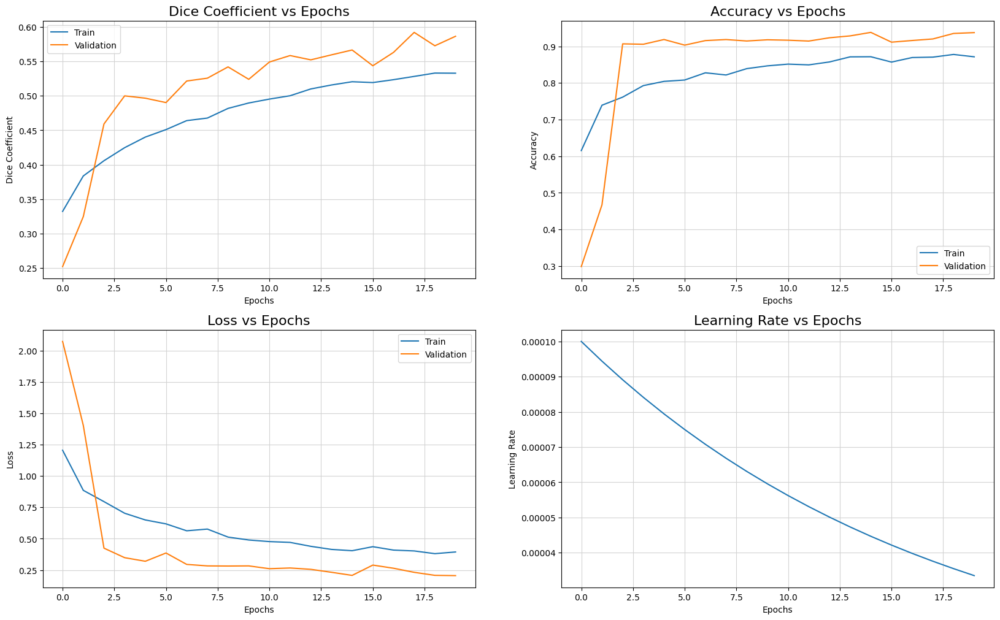

In [3]:
import pickle
import numpy as np
import pandas as pd
import albumentations as A
from IPython.display import SVG
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from PIL import Image, ImageFont
from collections import defaultdict
import os, re, sys, random, shutil, cv2

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import applications, optimizers
from tensorflow.keras.applications import VGG16, DenseNet121, InceptionResNetV2
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.utils import model_to_dot, plot_model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler, TensorBoard
from tensorflow.keras.layers import *


data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"
train_images = f"{data_dir}train_images/"
train_masks = f"{data_dir}train_masks/"
val_images = f"{data_dir}val_images/"
val_masks = f"{data_dir}val_masks/"
test_images = f"{data_dir}test_images/"
test_masks = f"{data_dir}test_masks/"

print('Number of images in training set: ', len(os.listdir(train_images+'train')))
print('Number of masks in training set: ', len(os.listdir(train_masks+'train')))

print('Number of images in testing set: ', len(os.listdir(test_images+'test')))
print('Number of masks in testing set: ', len(os.listdir(test_masks+'test')))

class_dict_df = pd.read_csv(f'{data_dir}class_dict.csv', index_col=False, skipinitialspace=True)
class_dict_df


label_names= list(class_dict_df.name)
label_codes = []
r= np.asarray(class_dict_df.r)
g= np.asarray(class_dict_df.g)
b= np.asarray(class_dict_df.b)

for i in range(len(class_dict_df)):
    label_codes.append(tuple([r[i], g[i], b[i]]))
    
label_codes, label_names

code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

def rgb_to_onehot(rgb_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (eg. 256 x 256 x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,)
    encoded_image = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(colormap):
        encoded_image[:,:,i] = np.all(rgb_image.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image

def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)


# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)
test_frames_datagen = ImageDataGenerator(**data_gen_args)
test_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1



def TrainAugmentGenerator(train_images_dir, train_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Train Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            train_images_dir - train images directory
            train_masks_dir - train masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(
    train_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    train_mask_generator = train_masks_datagen.flow_from_directory(
    train_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)

    while True:
        X1i = next(train_image_generator)
        X2i = next(train_mask_generator)
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

def ValAugmentGenerator(val_images_dir, val_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            val_images_dir - validation images directory
            val_masks_dir - validation masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    val_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    val_mask_generator = val_masks_datagen.flow_from_directory(
    val_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = next(val_image_generator)
        X2i = next(val_mask_generator)
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

        
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed = 1, batch_size = 8, target_size = (512, 512)):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    test_image_generator = test_frames_datagen.flow_from_directory(
    test_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    test_mask_generator = test_masks_datagen.flow_from_directory(
    test_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size)


    while True:
        X1i = next(test_image_generator)
        X2i = next(test_mask_generator)
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[0][x,:,:,:], id2code) for x in range(X2i[0].shape[0])]
        
        yield X1i[0], np.asarray(mask_encoded)

batch_size = 32
num_train_samples = len(np.sort(os.listdir(train_images+'train')))
num_val_samples = len(np.sort(os.listdir(val_images+'val')))
steps_per_epoch = int(np.ceil(float(num_train_samples) / float(batch_size)))
print('steps_per_epoch: ', steps_per_epoch)
validation_steps = int(np.ceil(float(2 * num_val_samples) / float(batch_size)))
print('validation_steps: ', validation_steps)


def dice_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)


def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

# Squeeze-and-Excitation Block
def se_block(input, ratio=8):
    channel_axis = -1
    filters = input.shape[channel_axis]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(input)
    se = Reshape(se_shape)(se)
    se = Dense(filters // ratio, activation='relu', kernel_initializer='he_normal', use_bias=False)(se)
    se = Dense(filters, activation='sigmoid', kernel_initializer='he_normal', use_bias=False)(se)
    x = Multiply()([input, se])
    return x

# Modified U-Net with SE blocks
def build_modified_unet(input_shape, num_classes):
    inputs = Input(input_shape)

    # Encoder
    conv1 = conv_block(inputs, 64)
    conv1 = se_block(conv1)
    pool1 = MaxPooling2D((2, 2))(conv1)

    conv2 = conv_block(pool1, 128)
    conv2 = se_block(conv2)
    pool2 = MaxPooling2D((2, 2))(conv2)

    conv3 = conv_block(pool2, 256)
    conv3 = se_block(conv3)
    pool3 = MaxPooling2D((2, 2))(conv3)

    conv4 = conv_block(pool3, 512)
    conv4 = se_block(conv4)
    pool4 = MaxPooling2D((2, 2))(conv4)

    # Bridge
    conv5 = conv_block(pool4, 1024)
    conv5 = se_block(conv5)

    # Decoder
    up6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    up6 = Concatenate()([up6, conv4])
    conv6 = conv_block(up6, 512)
    conv6 = se_block(conv6)

    up7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = Concatenate()([up7, conv3])
    conv7 = conv_block(up7, 256)
    conv7 = se_block(conv7)

    up8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = Concatenate()([up8, conv2])
    conv8 = conv_block(up8, 128)
    conv8 = se_block(conv8)

    up9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = Concatenate()([up9, conv1])
    conv9 = conv_block(up9, 64)
    conv9 = se_block(conv9)

    # Output
    outputs = Conv2D(num_classes, 1, activation='sigmoid', padding='same')(conv9)
    model = Model(inputs=inputs, outputs=outputs)
    return model

K.clear_session()

modified_unet = build_modified_unet(input_shape = (128, 128, 3), num_classes = 7)
modified_unet.compile(optimizer=Adam(learning_rate = 0.0001), loss='categorical_crossentropy', metrics=[dice_coef, "accuracy"])
modified_unet.summary()


def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.0001, 40)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = 'modified_unet.keras',
    save_best_only = True, 
#     save_weights_only = False,
    monitor = 'val_loss', 
    mode = 'auto', 
    verbose = 1
)

# earlystop = EarlyStopping(
#     monitor = 'val_loss', 
#     min_delta = 0.001, 
#     patience = 10, 
#     mode = 'auto', 
#     verbose = 1,
#     restore_best_weights = True
# )

csvlogger = CSVLogger(
    filename= "modified_unet_training.csv",
    separator = ",",
    append = False
)

callbacks = [checkpoint, csvlogger, lr_scheduler]



history_1 = modified_unet.fit(
    TrainAugmentGenerator(train_images_dir = train_images, train_masks_dir = train_masks, target_size = (128, 128)), 
    steps_per_epoch = steps_per_epoch,
    validation_data = ValAugmentGenerator(val_images_dir = test_images, val_masks_dir = test_masks, target_size = (128, 128)), 
    validation_steps = validation_steps, 
    epochs = 20,
    callbacks= callbacks,
    verbose = 1
)



fig, ax = plt.subplots(2, 2, figsize=(20, 12))
ax = ax.ravel()
metrics = ['Dice Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['dice_coef', 'accuracy', 'loss', 'lr']):
        if met != 'lr':
            ax[i].plot(history_1.history[met], '-')
            ax[i].plot(history_1.history['val_' + met], '-')
            ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
            ax[i].set_xlabel('Epochs')
            ax[i].set_ylabel(metrics[i])
            ax[i].legend(['Train', 'Validation'])
            ax[i].xaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
            ax[i].yaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
        else:
            # Calculate learning rates from your exponential decay function
            lrs = [exponential_decay(0.0001, 40)(epoch) for epoch in range(len(history_1.history['loss']))]
            ax[i].plot(lrs, '-')
            ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
            ax[i].set_xlabel('Epochs')
            ax[i].set_ylabel(metrics[i])
            ax[i].xaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
            ax[i].yaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")


        
plt.savefig('modified_unet_metrics_plot.png', facecolor= 'w',transparent= False, bbox_inches= 'tight', dpi= 300)



testing_gen = TestAugmentGenerator(test_images_dir =test_images, test_masks_dir=test_masks, batch_size=32, target_size=(128, 128))


modified_unet.load_weights("./modified_unet.keras")
modified_unet_eval = modified_unet.evaluate(testing_gen, steps=16, return_dict=True)



In [4]:
import os
import numpy as np
from tensorflow.keras.models import load_model

# Assuming you have already trained and saved your individual models
model_names = ["resnet_unet", "unet", "attention_unet", "unet_plus_plus", "vgg19_unet", "vgg16_unet", "modified_unet","modified_unet"]
input_shape = (128, 128, 3)
num_classes = 7
BATCH_SIZE = 32

# Data directories
data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"
train_images = os.path.join(data_dir, "train_images")
train_masks = os.path.join(data_dir, "train_masks")
val_images = os.path.join(data_dir, "val_images")
val_masks = os.path.join(data_dir, "val_masks")
test_images = os.path.join(data_dir, "test_images")
test_masks = os.path.join(data_dir, "test_masks")

# Data generator for test set
test_gen = TestAugmentGenerator(test_images, test_masks, target_size=(128, 128))
test_steps = int(np.ceil(len(os.listdir(test_images)) / BATCH_SIZE))

# Load models
models = []
for model_name in model_names:
    model = load_model(f'{model_name}.keras', custom_objects={'dice_coef': dice_coef}, safe_mode=False)
    models.append(model)

# Evaluate each model individually and save the evaluation metrics
evaluation_results = {}
for model_name, model in zip(model_names, models):
    print(f"Evaluating model: {model_name}")
    test_loss, test_dice_coef, test_accuracy = model.evaluate(test_gen, steps=test_steps)
    print(f"Test Dice Coefficient for {model_name}: {test_dice_coef:.4f}")
    print(f"Test Accuracy for {model_name}: {test_accuracy:.4f}")
    evaluation_results[model_name] = {
        "dice_coef": test_dice_coef,
        "accuracy": test_accuracy
    }

# Save the evaluation results
with open("model_evaluation_results.npy", "wb") as f:
    np.save(f, evaluation_results)

Evaluating model: resnet_unet
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step - accuracy: 0.9681 - dice_coef: 0.5851 - loss: 0.1179
Test Dice Coefficient for resnet_unet: 0.5851
Test Accuracy for resnet_unet: 0.9681
Evaluating model: unet
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - accuracy: 0.9420 - dice_coef: 0.5679 - loss: 0.1524
Test Dice Coefficient for unet: 0.5679
Test Accuracy for unet: 0.9420
Evaluating model: attention_unet
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step - accuracy: 0.9185 - dice_coef: 0.8884 - loss: 0.2406
Test Dice Coefficient for attention_unet: 0.8884
Test Accuracy for attention_unet: 0.9185
Evaluating model: unet_plus_plus
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step - accuracy: 0.9641 - dice_coef: 0.6602 - loss: 0.0973
Test Dice Coefficient for unet_plus_plus: 0.6602
Test Accuracy for unet_plus_plus: 0.9641
Evaluating model: vgg19_unet
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - accuracy: 0.8128 - dice_coef: 0.7797

Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
Ensemble Dice Score: 0.6466
Ensemble (weighted_ensemble) Accuracy: 0.9522


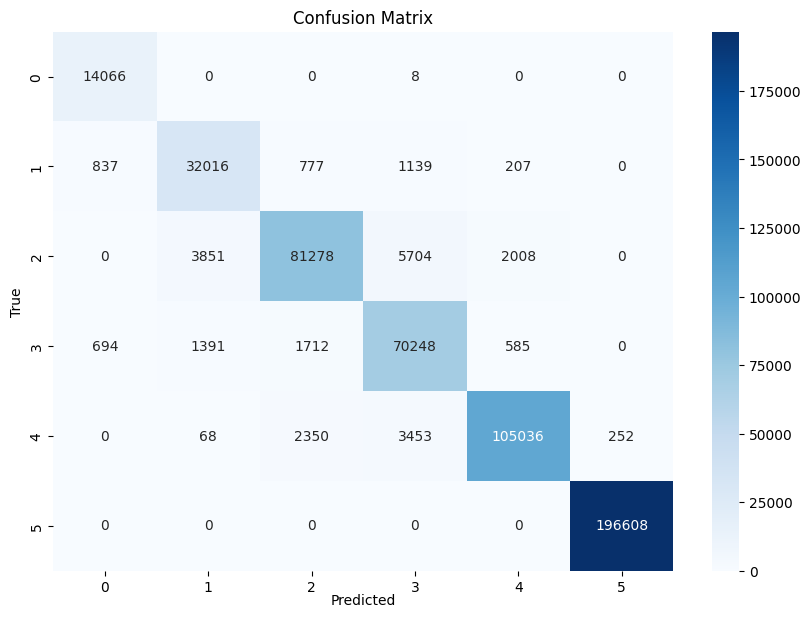

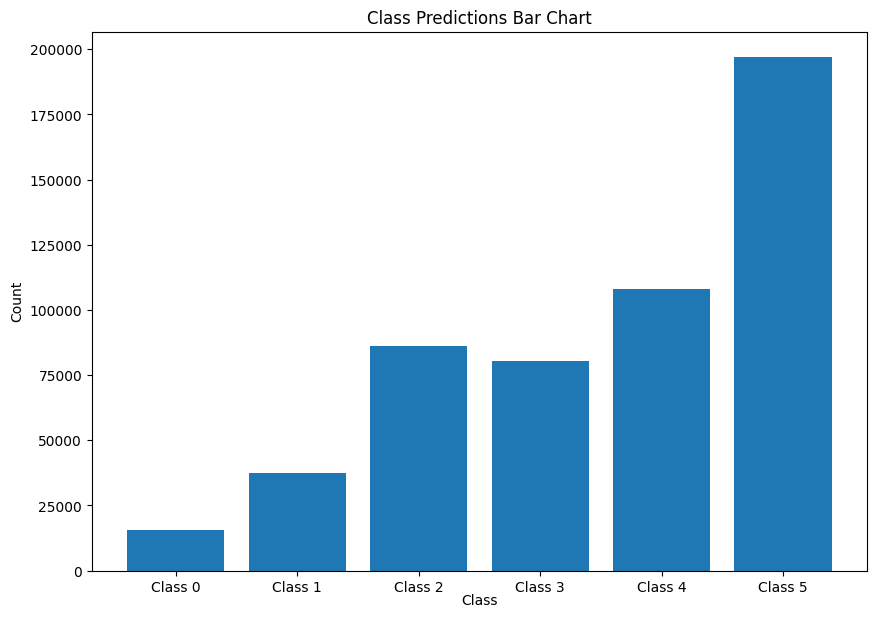

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.90      1.00      0.95     14074
     Class 1       0.86      0.92      0.89     34976
     Class 2       0.94      0.88      0.91     92841
     Class 3       0.87      0.94      0.91     74630
     Class 4       0.97      0.94      0.96    111159
     Class 5       1.00      1.00      1.00    196608

    accuracy                           0.95    524288
   macro avg       0.92      0.95      0.93    524288
weighted avg       0.95      0.95      0.95    524288



In [5]:
import numpy as np
import os
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, ConfusionMatrixDisplay
import matplotlib.pyplot as plt
import seaborn as sns

# Load the saved evaluation results
with open("model_evaluation_results.npy", "rb") as f:
    evaluation_results = np.load(f, allow_pickle=True).item()

# Assuming you have already trained and saved your individual models
model_names = ["resnet_unet", "unet", "attention_unet", "unet_plus_plus", "vgg19_unet", "vgg16_unet","modified_unet"]
input_shape = (128, 128, 3)
num_classes = 6  # Changed to 6
BATCH_SIZE = 32

# Data directories
data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"
test_images = os.path.join(data_dir, "test_images")
test_masks = os.path.join(data_dir, "test_masks")

# Define the generator function again to ensure it can be re-initialized
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = (128, 128)):
    '''Testing Image data generator
        Inputs:
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height, width)

        Output: Decoded RGB image (height x width x 3)
    '''
    test_frames_datagen = ImageDataGenerator(rescale=1./255)
    test_masks_datagen = ImageDataGenerator()

    test_image_generator = test_frames_datagen.flow_from_directory(
        test_images_dir,
        batch_size = batch_size,
        seed = seed,
        target_size = target_size,
        class_mode=None)

    test_mask_generator = test_masks_datagen.flow_from_directory(
        test_masks_dir,
        batch_size = batch_size,
        seed = seed,
        target_size = target_size,
        class_mode=None)

    while True:
        X1i = next(test_image_generator)
        X2i = next(test_mask_generator)

        # One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])]  #fixed indexing

        yield X1i, np.asarray(mask_encoded)

# Load models and their individual performance scores
models = []
for model_name in model_names:
    model = load_model(f'{model_name}.keras', custom_objects={'dice_coef': dice_coef}, safe_mode=False)
    models.append(model)

# Normalize the scores to sum to 1
total_score = sum(result["accuracy"] for result in evaluation_results.values())
weights = {name: result["accuracy"] / total_score for name, result in evaluation_results.items()}

def get_weighted_ensemble_predictions(models, test_images, test_masks, steps, weights):
    """Function to get weighted ensemble predictions from multiple models."""
    all_predictions = []
    
    for model, model_name in zip(models, model_names):
        # Re-initialize the generator for each model to ensure same data
        test_gen = TestAugmentGenerator(test_images, test_masks)
        predictions = model.predict(test_gen, steps=steps, verbose=1)
        weighted_predictions = predictions * weights[model_name]
        all_predictions.append(weighted_predictions)
    
    # Summing the weighted predictions
    ensemble_predictions = np.sum(np.array(all_predictions), axis=0)
    
    return ensemble_predictions

# Get weighted ensemble predictions
ensemble_predictions = get_weighted_ensemble_predictions(models, test_images, test_masks, test_steps, weights)

# Evaluate the ensemble model
def evaluate_ensemble_performance(ensemble_predictions, test_images, test_masks, steps):
    """Function to evaluate ensemble performance."""
    test_gen = TestAugmentGenerator(test_images, test_masks)
    all_labels = []
    
    for _ in range(steps):
        _, labels = next(test_gen)
        all_labels.append(labels)
        
    true_labels = np.concatenate(all_labels, axis=0)
    
    # Calculate metrics
    dice_score = dice_coef(true_labels, ensemble_predictions).numpy()
    accuracy = accuracy_score(np.argmax(true_labels, axis=-1).flatten(), np.argmax(ensemble_predictions, axis=-1).flatten())
    
    return dice_score, accuracy, true_labels

# Evaluate ensemble model
ensemble_dice_score, ensemble_accuracy, true_labels = evaluate_ensemble_performance(ensemble_predictions, test_images, test_masks, test_steps)

print(f"Ensemble Dice Score: {ensemble_dice_score:.4f}")
print(f"Ensemble (weighted_ensemble) Accuracy: {ensemble_accuracy:.4f}")

# Calculate confusion matrix
true_labels_flat = np.argmax(true_labels, axis=-1).flatten()
ensemble_predictions_flat = np.argmax(ensemble_predictions, axis=-1).flatten()
conf_matrix = confusion_matrix(true_labels_flat, ensemble_predictions_flat)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted",labelpad=-1)
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# Class predictions bar chart
class_counts = np.bincount(ensemble_predictions_flat, minlength=num_classes)
plt.figure(figsize=(10, 7))
plt.bar(range(num_classes), class_counts, tick_label=[f'Class {i}' for i in range(num_classes)])
plt.xlabel("Class",labelpad=-1)
plt.ylabel("Count")
plt.title("Class Predictions Bar Chart")
plt.show()

# Classification report
report = classification_report(true_labels_flat, ensemble_predictions_flat, target_names=[f'Class {i}' for i in range(num_classes)])
print("Classification Report:")
print(report)

Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
Ensemble Accuracy (Majority Voting): 0.9516


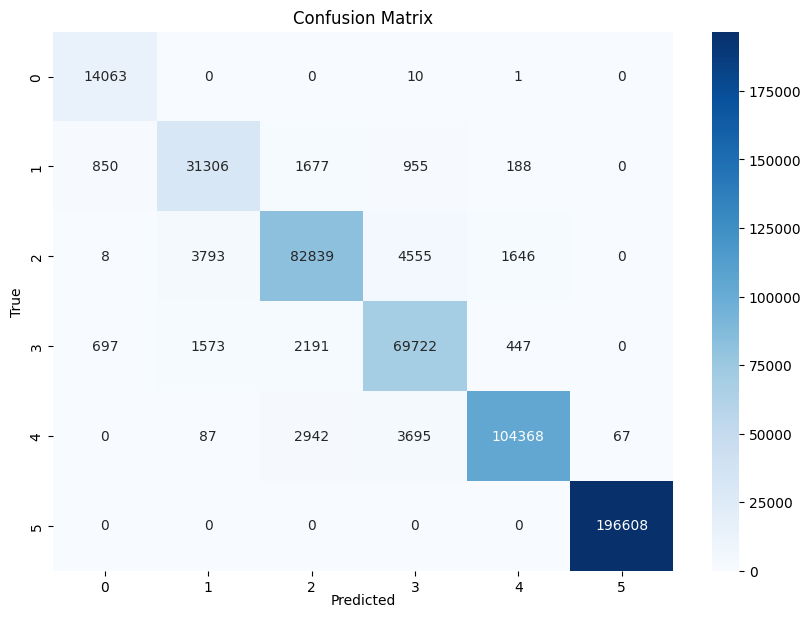

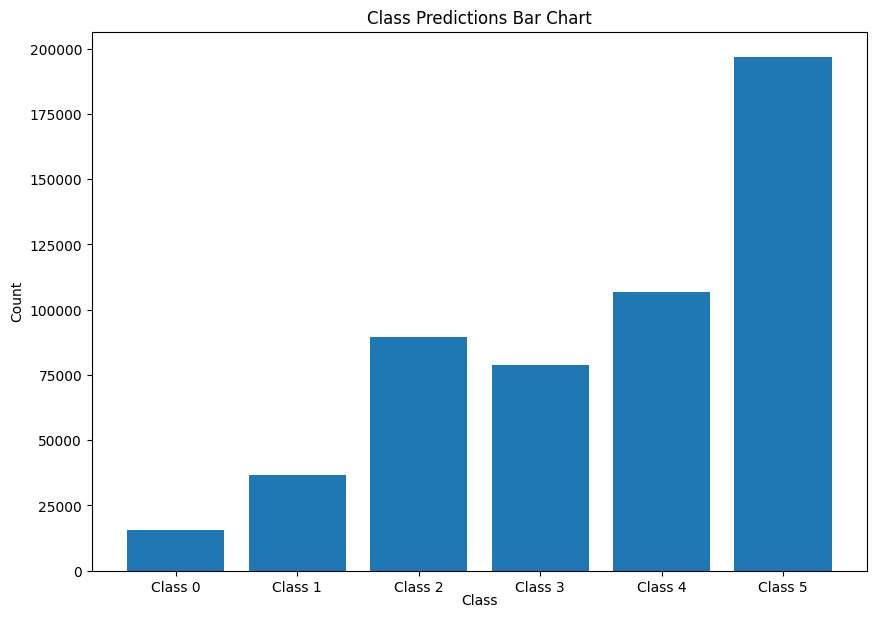

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.90      1.00      0.95     14074
     Class 1       0.85      0.90      0.87     34976
     Class 2       0.92      0.89      0.91     92841
     Class 3       0.88      0.93      0.91     74630
     Class 4       0.98      0.94      0.96    111159
     Class 5       1.00      1.00      1.00    196608

    accuracy                           0.95    524288
   macro avg       0.92      0.94      0.93    524288
weighted avg       0.95      0.95      0.95    524288



In [6]:
import numpy as np
import os
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Load the saved evaluation results
with open("model_evaluation_results.npy", "rb") as f:
    evaluation_results = np.load(f, allow_pickle=True).item()

# Assuming you have already trained and saved your individual models
model_names = ["resnet_unet", "unet", "attention_unet", "unet_plus_plus", "vgg19_unet", "vgg16_unet","modified_unet"]
input_shape = (128, 128, 3)
num_classes = 6  # Changed to 6
BATCH_SIZE = 32

# Data directories
data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"
test_images = os.path.join(data_dir, "test_images")
test_masks = os.path.join(data_dir, "test_masks")

# Define the generator function again to ensure it can be re-initialized
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = (128, 128)):
    '''Testing Image data generator
        Inputs:
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height, width)

        Output: Decoded RGB image (height x width x 3)
    '''
    test_frames_datagen = ImageDataGenerator(rescale=1./255)
    test_masks_datagen = ImageDataGenerator()

    test_image_generator = test_frames_datagen.flow_from_directory(
        test_images_dir,
        batch_size = batch_size,
        seed = seed,
        target_size = target_size,
        class_mode=None)

    test_mask_generator = test_masks_datagen.flow_from_directory(
        test_masks_dir,
        batch_size = batch_size,
        seed = seed,
        target_size = target_size,
        class_mode=None)

    while True:
        X1i = next(test_image_generator)
        X2i = next(test_mask_generator)

        # One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])]  #fixed indexing

        yield X1i, np.asarray(mask_encoded)

# Load models and their individual performance scores
models = []
for model_name in model_names:
    model = load_model(f'{model_name}.keras', custom_objects={'dice_coef': dice_coef}, safe_mode=False)
    models.append(model)

def get_majority_voting_predictions(models, test_images, test_masks, steps):
    """Function to get majority voting predictions from multiple models."""
    all_predictions = []
    
    for model in models:
        # Re-initialize the generator for each model to ensure same data
        test_gen = TestAugmentGenerator(test_images, test_masks)
        predictions = model.predict(test_gen, steps=steps, verbose=1)
        all_predictions.append(np.argmax(predictions, axis=-1))
    
    # Convert list of arrays to a numpy array
    all_predictions = np.array(all_predictions)
    
    # Majority voting
    majority_voting_predictions = np.apply_along_axis(lambda x: np.bincount(x, minlength=num_classes).argmax(), axis=0, arr=all_predictions)
    
    return majority_voting_predictions

# Get majority voting predictions
majority_voting_predictions = get_majority_voting_predictions(models, test_images, test_masks, test_steps)

# Evaluate the ensemble model using majority voting
def evaluate_majority_voting_performance(majority_voting_predictions, test_images, test_masks, steps):
    """Function to evaluate majority voting ensemble performance."""
    test_gen = TestAugmentGenerator(test_images, test_masks)
    all_labels = []
    
    for _ in range(steps):
        _, labels = next(test_gen)
        all_labels.append(labels)
        
    true_labels = np.argmax(np.concatenate(all_labels, axis=0), axis=-1)
    
    # Calculate metrics
    accuracy = accuracy_score(true_labels.flatten(), majority_voting_predictions.flatten())
    
    return accuracy, true_labels

# Evaluate ensemble model
ensemble_accuracy, true_labels = evaluate_majority_voting_performance(majority_voting_predictions, test_images, test_masks, test_steps)

print(f"Ensemble Accuracy (Majority Voting): {ensemble_accuracy:.4f}")

# Calculate confusion matrix
true_labels_flat = true_labels.flatten()
majority_voting_predictions_flat = majority_voting_predictions.flatten()
conf_matrix = confusion_matrix(true_labels_flat, majority_voting_predictions_flat)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted", labelpad=-1)
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# Class predictions bar chart
class_counts = np.bincount(majority_voting_predictions_flat, minlength=num_classes)
plt.figure(figsize=(10, 7))
plt.bar(range(num_classes), class_counts, tick_label=[f'Class {i}' for i in range(num_classes)])
plt.xlabel("Class", labelpad=-1)
plt.ylabel("Count")
plt.title("Class Predictions Bar Chart")
plt.show()

# Classification report
report = classification_report(true_labels_flat, majority_voting_predictions_flat, target_names=[f'Class {i}' for i in range(num_classes)])
print("Classification Report:")
print(report)

Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
Ensemble Accuracy (Soft Voting): 0.9513


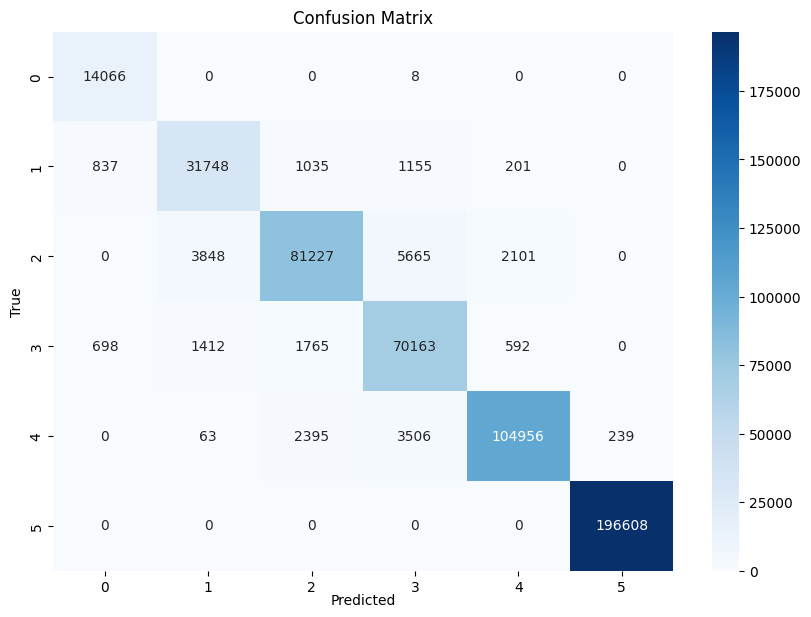

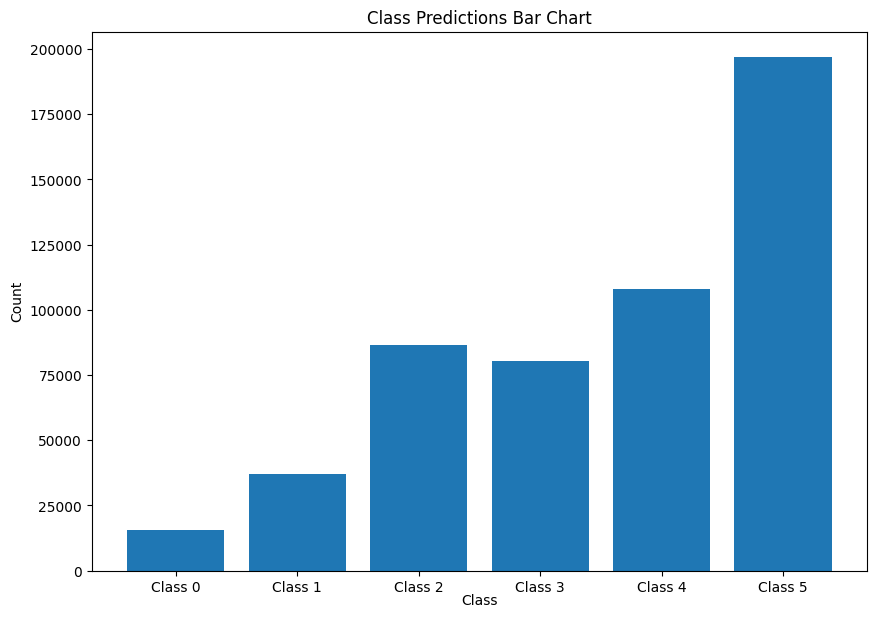

Classification Report:
              precision    recall  f1-score   support

     Class 0       0.90      1.00      0.95     14074
     Class 1       0.86      0.91      0.88     34976
     Class 2       0.94      0.87      0.91     92841
     Class 3       0.87      0.94      0.90     74630
     Class 4       0.97      0.94      0.96    111159
     Class 5       1.00      1.00      1.00    196608

    accuracy                           0.95    524288
   macro avg       0.92      0.94      0.93    524288
weighted avg       0.95      0.95      0.95    524288



In [7]:
import numpy as np
import os
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Load the saved evaluation results
with open("model_evaluation_results.npy", "rb") as f:
    evaluation_results = np.load(f, allow_pickle=True).item()

# Assuming you have already trained and saved your individual models
model_names = ["resnet_unet", "unet", "attention_unet", "unet_plus_plus", "vgg19_unet", "vgg16_unet","modified_unet"]
input_shape = (128, 128, 3)
num_classes = 6  # Changed to 6
BATCH_SIZE = 32

# Data directories
data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"
test_images = os.path.join(data_dir, "test_images")
test_masks = os.path.join(data_dir, "test_masks")

# Define the generator function again to ensure it can be re-initialized
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = (128, 128)):
    '''Testing Image data generator
        Inputs:
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height, width)

        Output: Decoded RGB image (height x width x 3)
    '''
    test_frames_datagen = ImageDataGenerator(rescale=1./255)
    test_masks_datagen = ImageDataGenerator()

    test_image_generator = test_frames_datagen.flow_from_directory(
        test_images_dir,
        batch_size = batch_size,
        seed = seed,
        target_size = target_size,
        class_mode=None)

    test_mask_generator = test_masks_datagen.flow_from_directory(
        test_masks_dir,
        batch_size = batch_size,
        seed = seed,
        target_size = target_size,
        class_mode=None)

    while True:
        X1i = next(test_image_generator)
        X2i = next(test_mask_generator)

        # One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])]  #fixed indexing

        yield X1i, np.asarray(mask_encoded)

# Load models and their individual performance scores
models = []
for model_name in model_names:
    model = load_model(f'{model_name}.keras', custom_objects={'dice_coef': dice_coef}, safe_mode=False)
    models.append(model)

def get_soft_voting_predictions(models, test_images, test_masks, steps):
    """Function to get soft voting predictions from multiple models."""
    all_predictions = []
    
    for model in models:
        # Re-initialize the generator for each model to ensure same data
        test_gen = TestAugmentGenerator(test_images, test_masks)
        predictions = model.predict(test_gen, steps=steps, verbose=1)
        all_predictions.append(predictions)
    
    # Convert list of arrays to a numpy array and average the probabilities
    all_predictions = np.mean(np.array(all_predictions), axis=0)
    
    return all_predictions

# Get soft voting predictions
soft_voting_predictions = get_soft_voting_predictions(models, test_images, test_masks, test_steps)

# Evaluate the ensemble model using soft voting
def evaluate_soft_voting_performance(soft_voting_predictions, test_images, test_masks, steps):
    """Function to evaluate soft voting ensemble performance."""
    test_gen = TestAugmentGenerator(test_images, test_masks)
    all_labels = []
    
    for _ in range(steps):
        _, labels = next(test_gen)
        all_labels.append(labels)
        
    true_labels = np.argmax(np.concatenate(all_labels, axis=0), axis=-1)
    
    # Calculate metrics
    accuracy = accuracy_score(true_labels.flatten(), np.argmax(soft_voting_predictions, axis=-1).flatten())
    
    return accuracy, true_labels

# Evaluate ensemble model
ensemble_accuracy, true_labels = evaluate_soft_voting_performance(soft_voting_predictions, test_images, test_masks, test_steps)

print(f"Ensemble Accuracy (Soft Voting): {ensemble_accuracy:.4f}")

# Calculate confusion matrix
true_labels_flat = true_labels.flatten()
soft_voting_predictions_flat = np.argmax(soft_voting_predictions, axis=-1).flatten()
conf_matrix = confusion_matrix(true_labels_flat, soft_voting_predictions_flat)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted", labelpad=-1)
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

# Class predictions bar chart
class_counts = np.bincount(soft_voting_predictions_flat, minlength=num_classes)
plt.figure(figsize=(10, 7))
plt.bar(range(num_classes), class_counts, tick_label=[f'Class {i}' for i in range(num_classes)])
plt.xlabel("Class", labelpad=-1)
plt.ylabel("Count")
plt.title("Class Predictions Bar Chart")
plt.show()

# Classification report
report = classification_report(true_labels_flat, soft_voting_predictions_flat, target_names=[f'Class {i}' for i in range(num_classes)])
print("Classification Report:")
print(report)

Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 201ms/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 189ms/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 197ms/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
10/10 ━━━━━━━━━━━━━━━━━━━━ 3s 188ms/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.
10/10 ━━━━━━━━━━━━━━━━━━━━ 4s 188ms/step
Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
131072/131072 ━━━━━━━━━━━━━━━━━━━━ 336s 3ms/step - accuracy: 0.9668 - loss: 0.0868 - val_accuracy: 0.9739 - val_loss: 0.0656
Epoch 2/10
131072/131072 ━━━━━━━━━━━━━━━━━━━━ 331s 3ms/step - accuracy: 0.9744 - loss: 0.0642 - val_accuracy: 0.9756 - val_loss: 0.0611
Epoch 3/10
131072/131072 ━━━━━━━━━━━━━━━━━━━━ 332s 3ms/step - accuracy: 0.9768 - loss: 0.0587 - val_accuracy: 0.9778 - val_loss: 0.0558
Epoch 4/10
131072/131072 ━━━━━━━━━━━━━━━━━━━━ 332s 3ms/step - accuracy: 0.9781 - loss: 0.0554 - val_accuracy: 0.9784 - val_loss: 0.0564
Epoch 5/10
131072/131072 ━━━━━━━━━━━━━━━━━━━━ 332s 3ms/step - accuracy: 0.9789 - loss: 0.0537 - val_accuracy: 0.9793 - val_loss: 0.0524
Epoch 6/10
131072/131072 ━━━━━━━━━━━━━━━━━━━━ 334s 3ms/step - accuracy: 0.9794 - loss: 0.0524 - val_accuracy: 0.9791 - val_loss: 0.0530
Epoch 7/10
131072/131072 ━━━━━━━━━━━━━━━━━━━━ 332s 3ms/step - accuracy: 0.9798 - loss: 0.0516 - val_accuracy: 0.9802 - val_loss: 0.0507
Epoch 8/10
131072/131072 ━━━━━━━━━━━━━━━━━━━━ 33

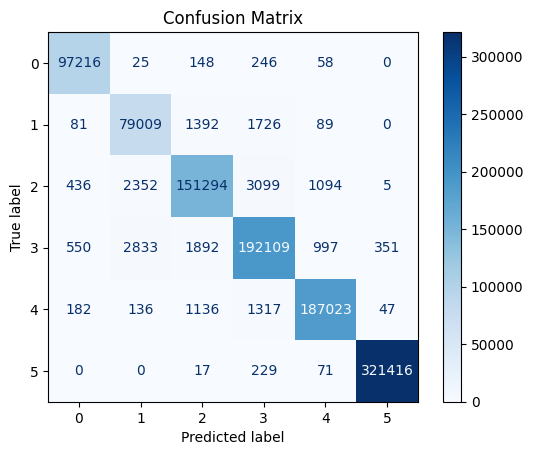

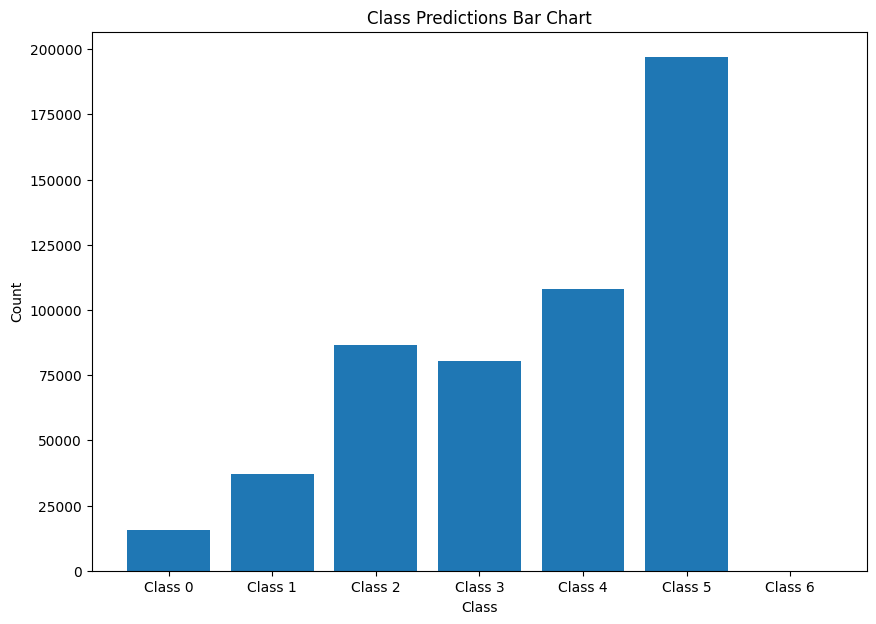

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     97693
           1       0.94      0.96      0.95     82297
           2       0.97      0.96      0.96    158280
           3       0.97      0.97      0.97    198732
           4       0.99      0.99      0.99    189841
           5       1.00      1.00      1.00    321733

    accuracy                           0.98   1048576
   macro avg       0.97      0.98      0.98   1048576
weighted avg       0.98      0.98      0.98   1048576



In [8]:
import numpy as np
import os
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.layers import Dense, Flatten, Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define custom functions (e.g., dice_coef, rgb_to_onehot, id2code) as needed

# Load the saved evaluation results
with open("model_evaluation_results.npy", "rb") as f:
    evaluation_results = np.load(f, allow_pickle=True).item()

# Assuming you have already trained and saved your individual models
model_names = ["resnet_unet", "unet", "attention_unet", "unet_plus_plus", "vgg19_unet", "vgg16_unet", "modified_unet"]
input_shape = (128, 128, 3)
num_classes = 7
BATCH_SIZE = 32

# Data directories
data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"
test_images = os.path.join(data_dir, "test_images")
test_masks = os.path.join(data_dir, "test_masks")

# Define the generator function again to ensure it can be re-initialized
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed=1, batch_size=BATCH_SIZE, target_size=(128, 128)):
    '''Testing Image data generator
        Inputs:
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height, width)

        Output: Decoded RGB image (height x width x 3)
    '''
    test_frames_datagen = ImageDataGenerator(rescale=1./255)
    test_masks_datagen = ImageDataGenerator()

    test_image_generator = test_frames_datagen.flow_from_directory(
        test_images_dir,
        batch_size=batch_size,
        seed=seed,
        target_size=target_size,
        class_mode=None)

    test_mask_generator = test_masks_datagen.flow_from_directory(
        test_masks_dir,
        batch_size=batch_size,
        seed=seed,
        target_size=target_size,
        class_mode=None)

    while True:
        X1i = next(test_image_generator)
        X2i = next(test_mask_generator)

        # One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x, :, :, :], id2code) for x in range(X2i.shape[0])]  # fixed indexing

        yield X1i, np.asarray(mask_encoded)

# Load models and their individual performance scores
models = []
for model_name in model_names:
    model = load_model(f'{model_name}.keras', custom_objects={'dice_coef': dice_coef}, safe_mode=False)
    models.append(model)

# Collect predictions from all models
def collect_predictions(models, test_images, test_masks, steps):
    all_predictions = []
    all_labels = []
    
    for model in models:
        test_gen = TestAugmentGenerator(test_images, test_masks)
        predictions = model.predict(test_gen, steps=steps, verbose=1)
        all_predictions.append(predictions)
    
    test_gen = TestAugmentGenerator(test_images, test_masks)
    for _ in range(steps):
        _, labels = next(test_gen)
        all_labels.append(labels)
    
    true_labels = np.concatenate(all_labels, axis=0)
    all_predictions = np.array(all_predictions)
    
    return all_predictions, true_labels

# Get predictions and true labels
test_steps = 10  # Define the number of steps as needed
all_predictions, true_labels = collect_predictions(models, test_images, test_masks, test_steps)

# Ensure dimensions are consistent for reshaping
n_samples = true_labels.shape[0] * true_labels.shape[1] * true_labels.shape[2]
X_meta = all_predictions.transpose(1, 2, 3, 0, 4).reshape(-1, num_classes * len(models))
y_meta = np.argmax(true_labels, axis=-1).flatten()

# Split into training and validation sets for the meta-learner
X_train, X_val, y_train, y_val = train_test_split(X_meta, y_meta, test_size=0.2, random_state=42)

# Define the meta-learner model
meta_model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(64, activation='relu'),
    Dense(num_classes, activation='softmax')
])

meta_model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the meta-learner
meta_model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_val, y_val))

# Evaluate the meta-learner
meta_predictions = meta_model.predict(X_val)
meta_accuracy = accuracy_score(y_val, np.argmax(meta_predictions, axis=-1))

print(f"Meta-Learner Accuracy: {meta_accuracy:.4f}")

# Confusion Matrix
cm = confusion_matrix(y_val, np.argmax(meta_predictions, axis=-1))
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

# Class predictions bar chart
class_counts = np.bincount(soft_voting_predictions_flat, minlength=num_classes)
plt.figure(figsize=(10, 7))
plt.bar(range(num_classes), class_counts, tick_label=[f'Class {i}' for i in range(num_classes)])
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Class Predictions Bar Chart")
plt.show()


# Classification Report
print("Classification Report:")
print(classification_report(y_val, np.argmax(meta_predictions, axis=-1)))

Number of images in training set:  7128
Number of masks in training set:  7128
Number of images in testing set:  891
Number of masks in testing set:  891
steps_per_epoch:  223
validation_steps:  56
Found 7128 images belonging to 1 classes.
Found 7128 images belonging to 1 classes.

Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 305ms/step - accuracy: 0.4478 - dice_coef: 0.3080 - loss: 1.5769Found 891 images belonging to 1 classes.
Found 891 images belonging to 1 classes.

Epoch 1: val_loss improved from inf to 1.95591, saving model to resnet_unet.keras
223/223 ━━━━━━━━━━━━━━━━━━━━ 173s 418ms/step - accuracy: 0.4486 - dice_coef: 0.3082 - loss: 1.5751 - val_accuracy: 0.3125 - val_dice_coef: 0.2395 - val_loss: 1.9559 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.440608762859235e-05.
Epoch 2/20
223/223 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step - accuracy: 0.8551 - dice_coef: 0.4494 - loss: 0.6571


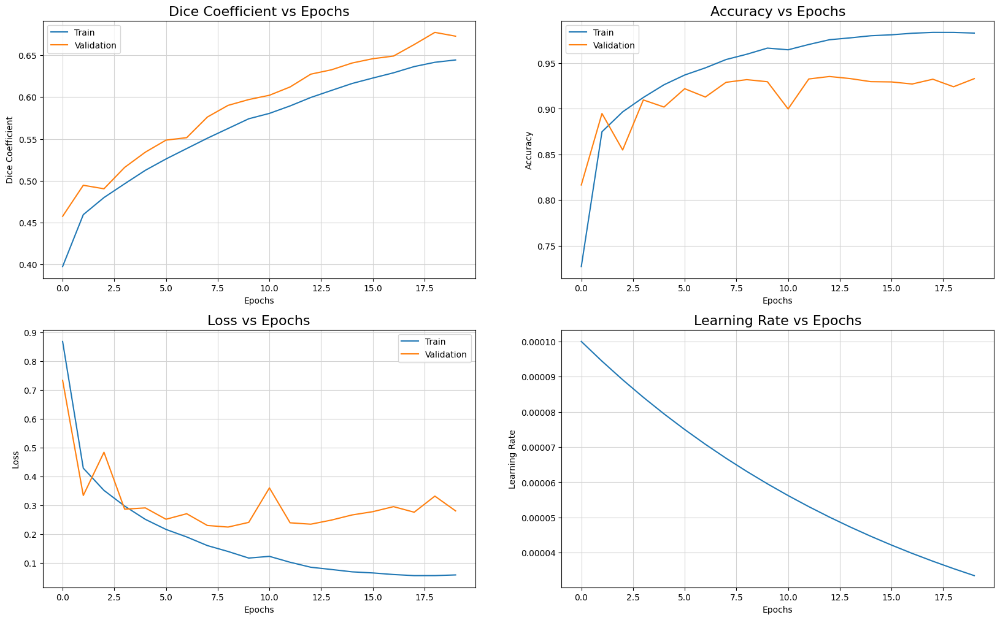

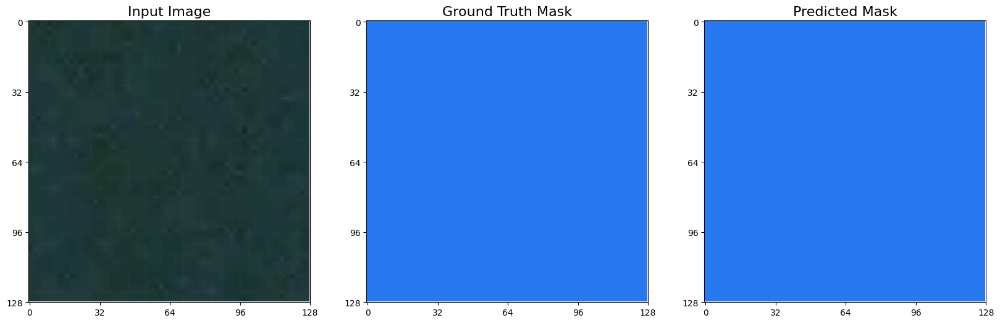

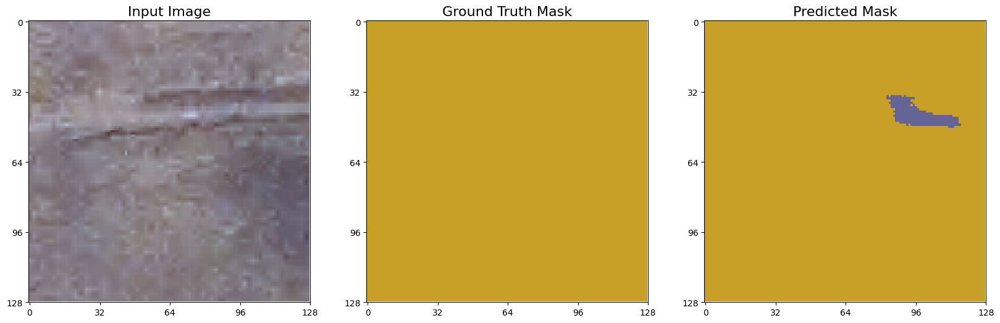

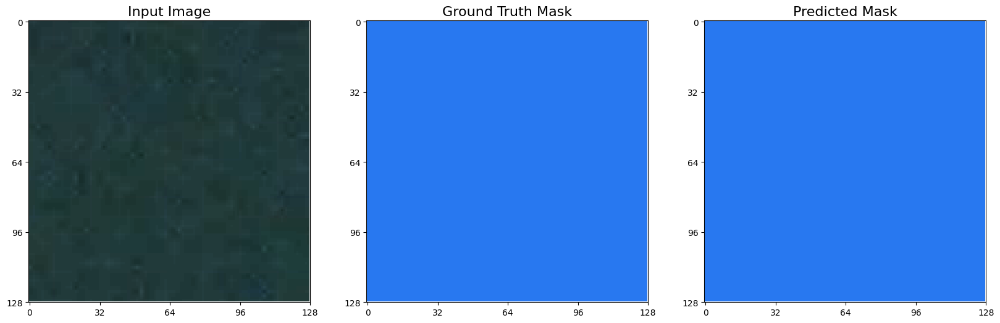

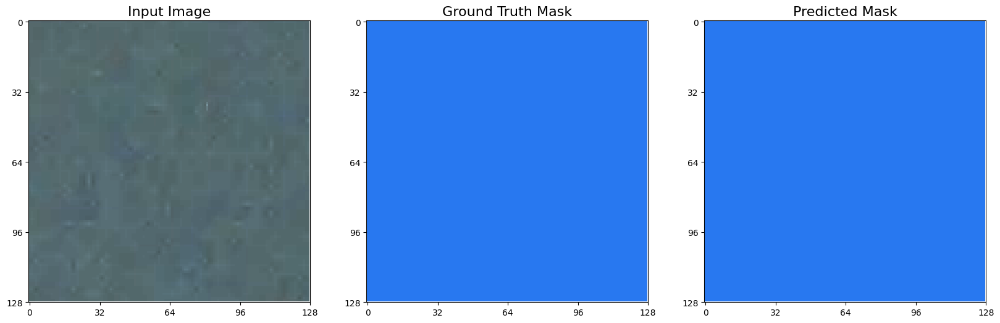

...

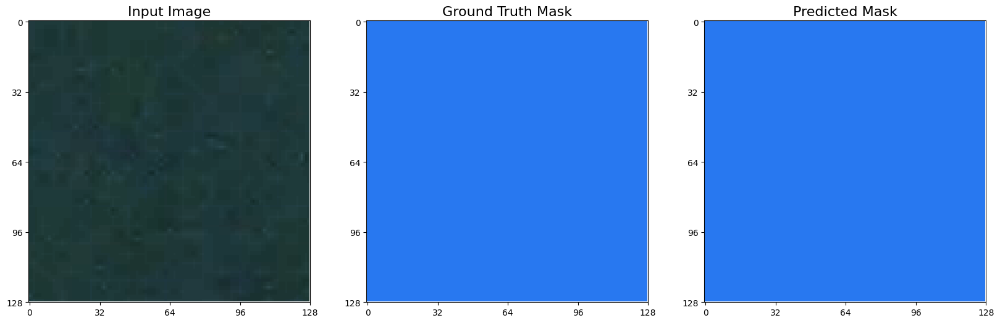

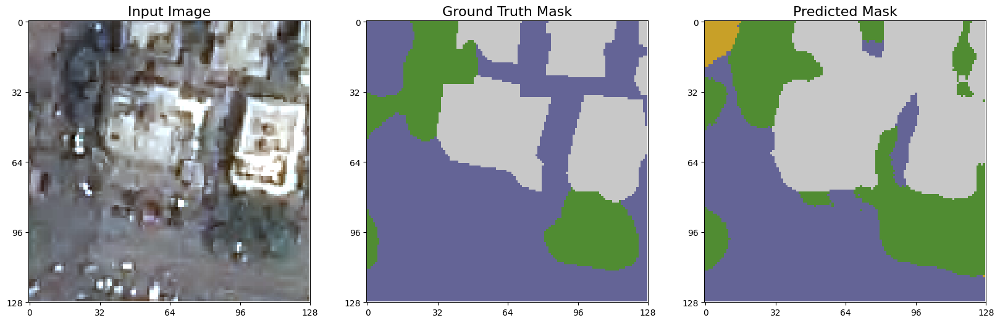

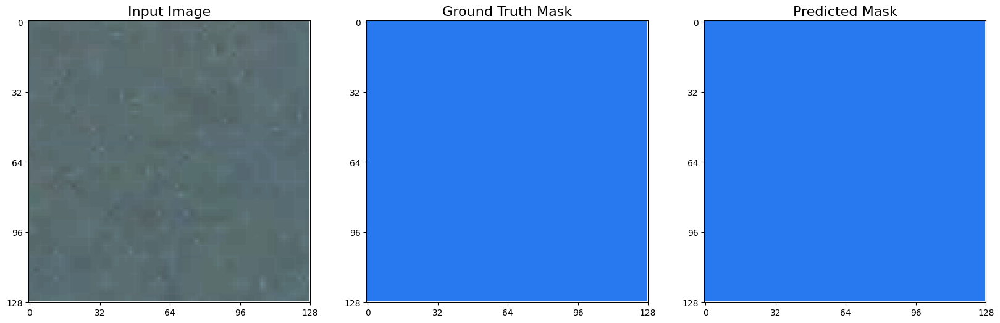

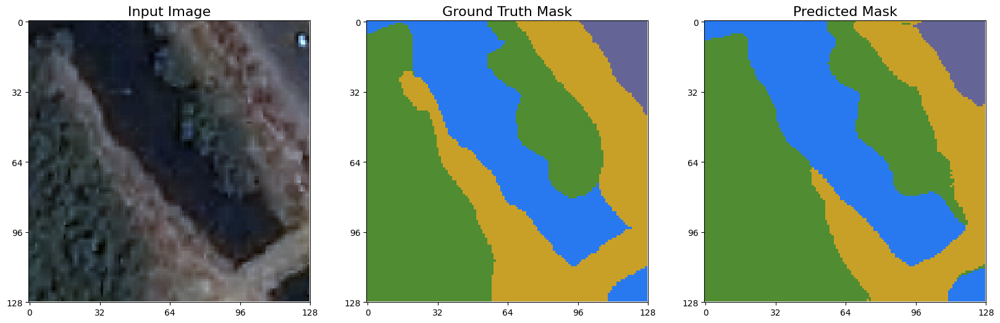

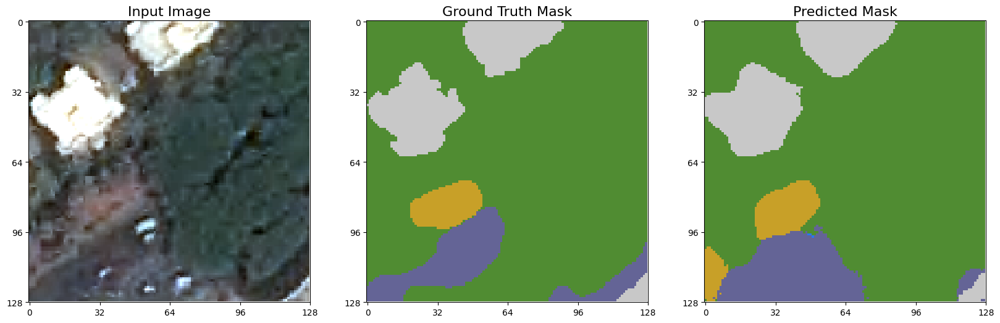

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step


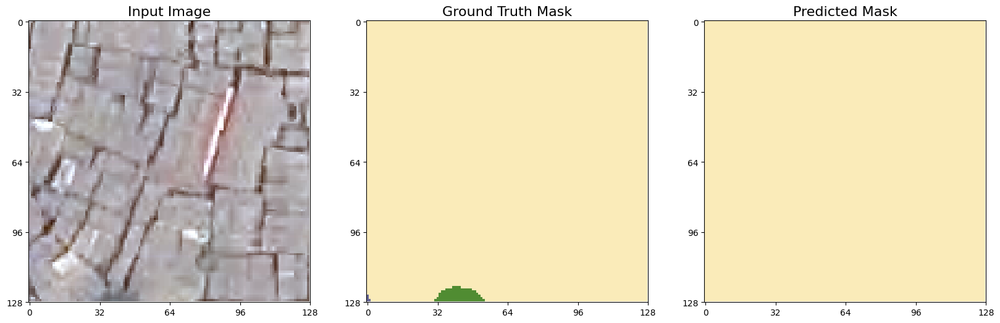

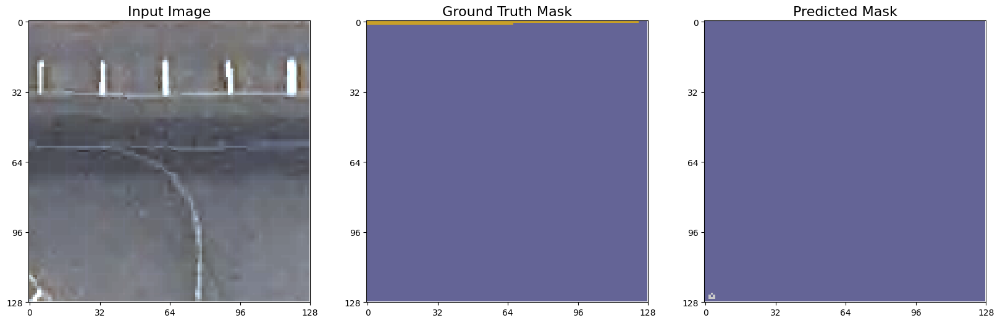

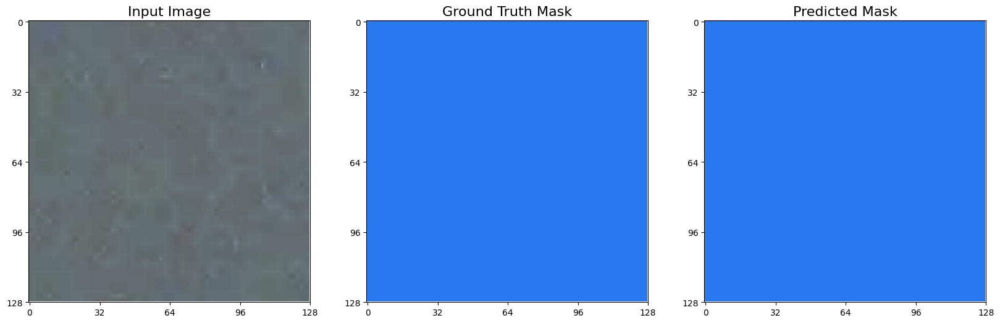

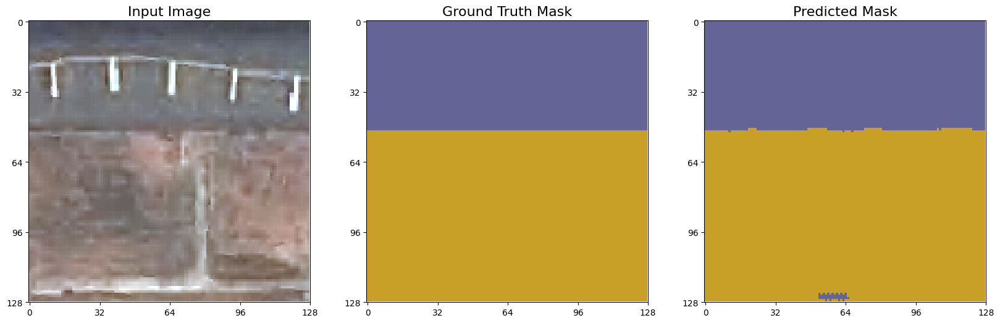

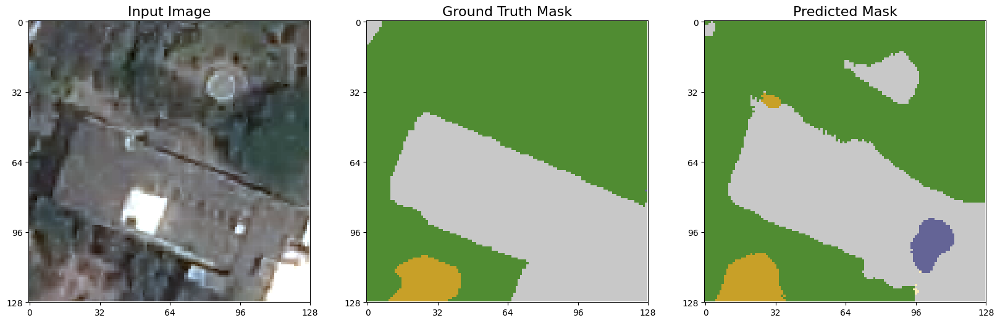

...

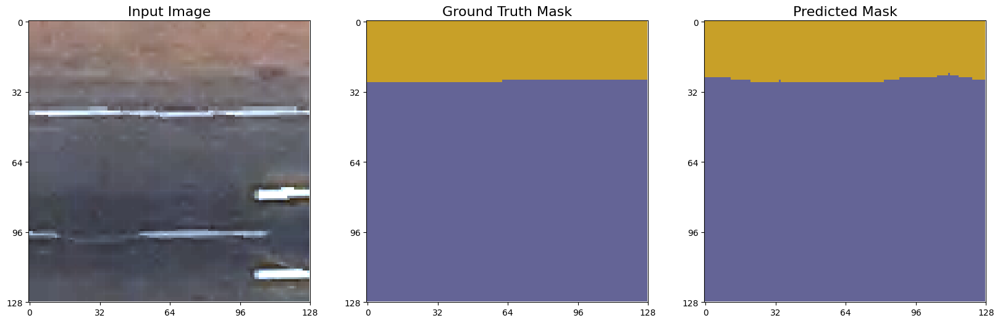

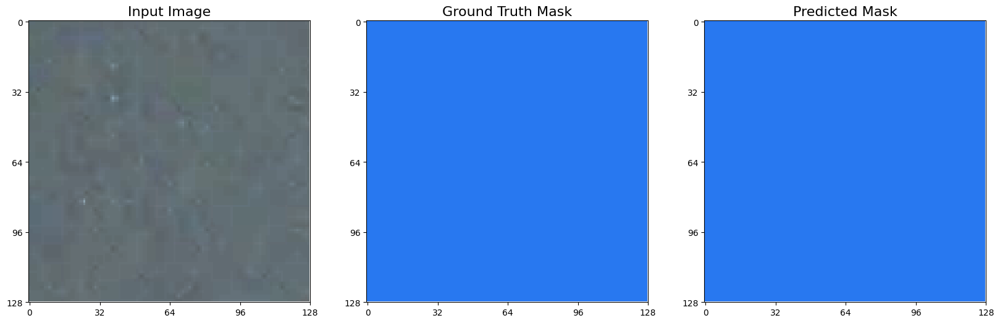

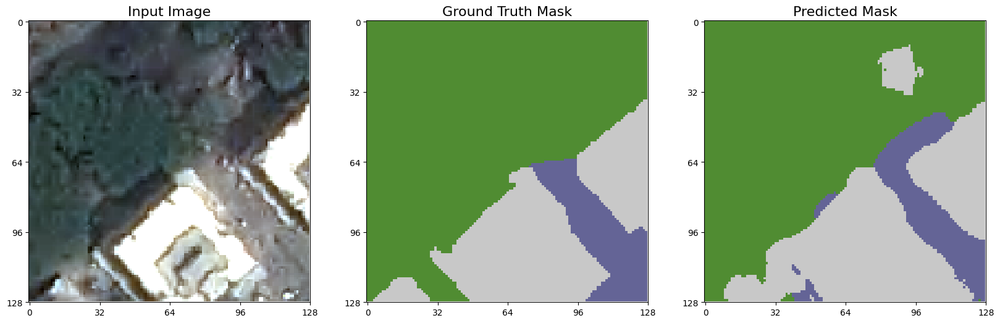

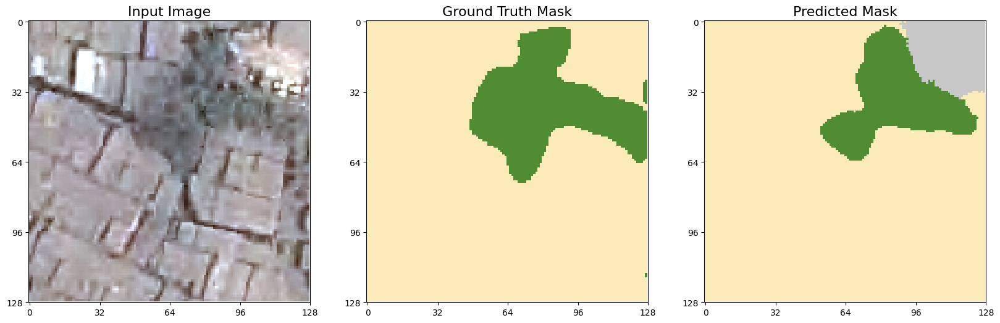

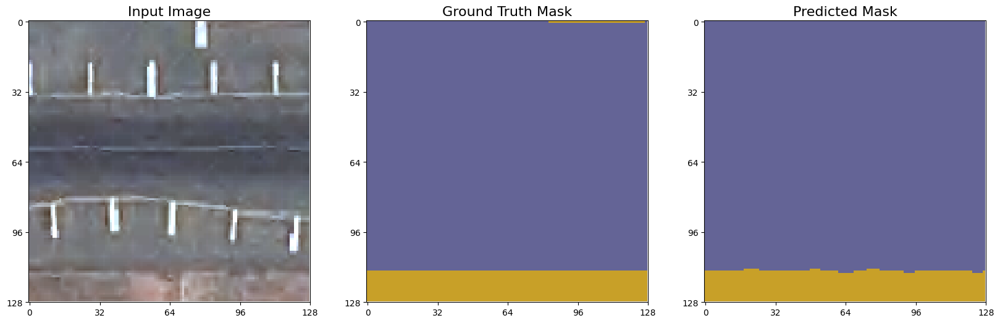

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step


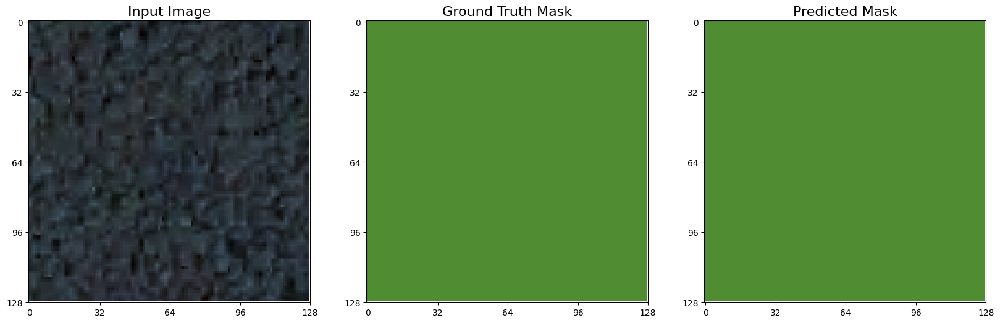

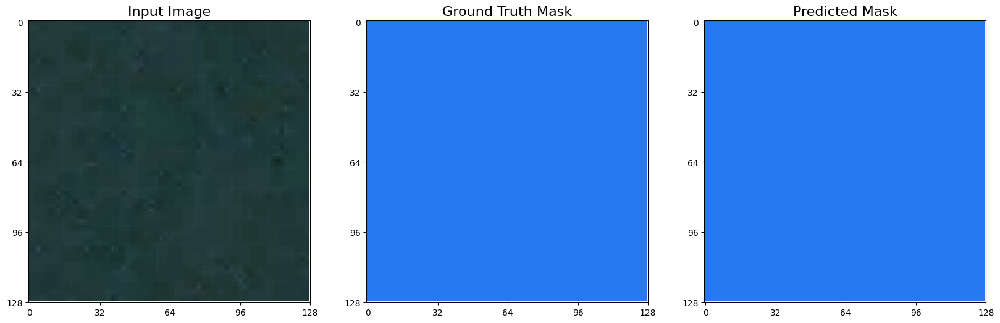

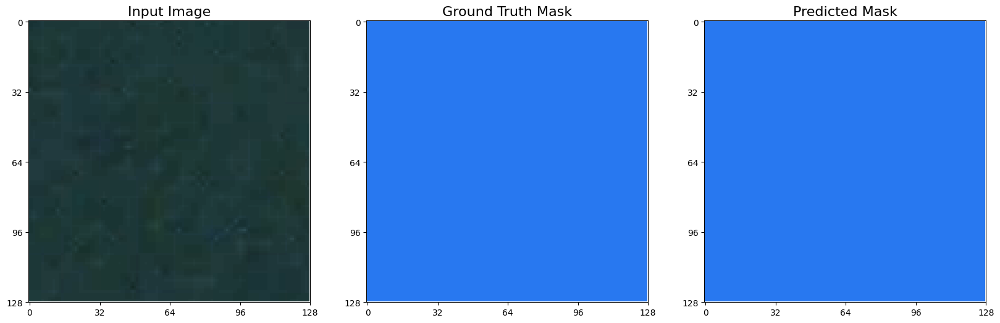

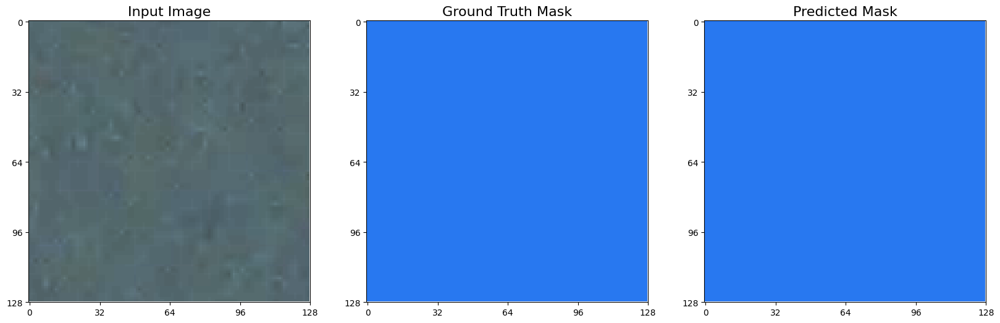

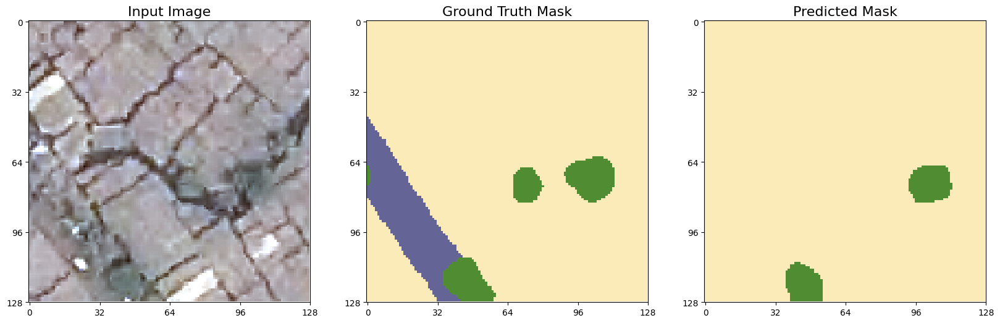

...

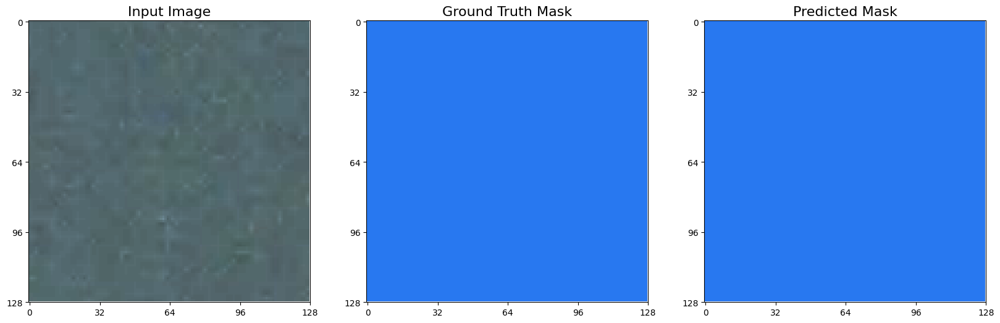

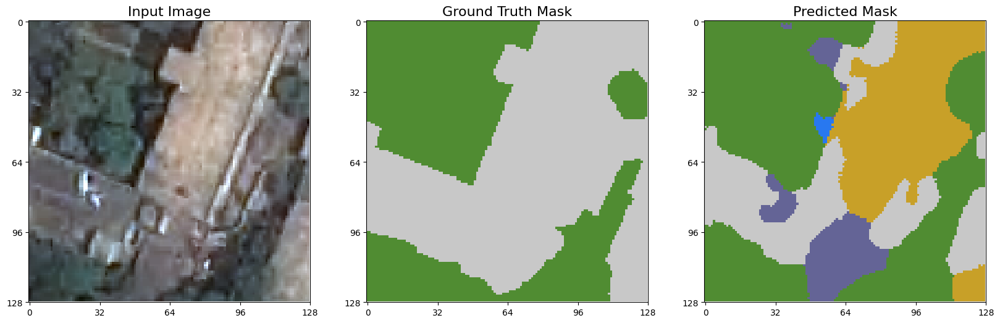

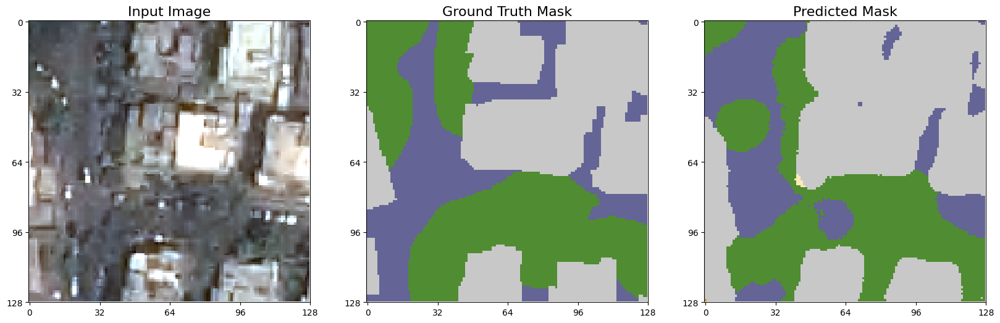

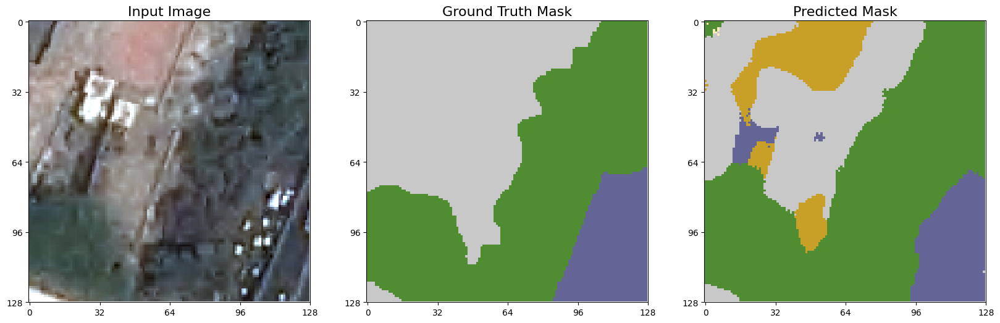

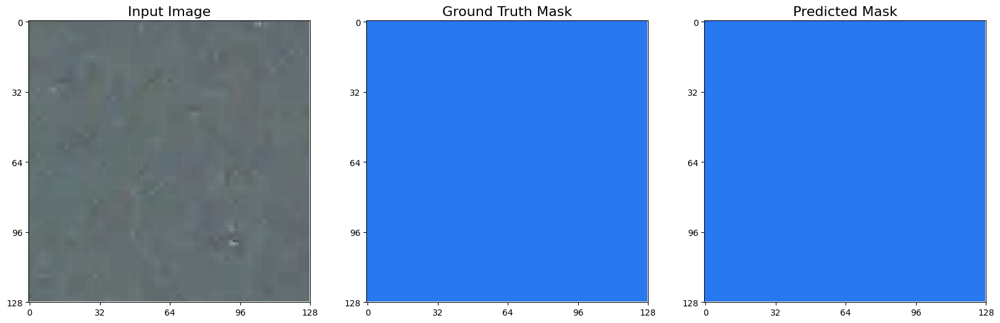

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


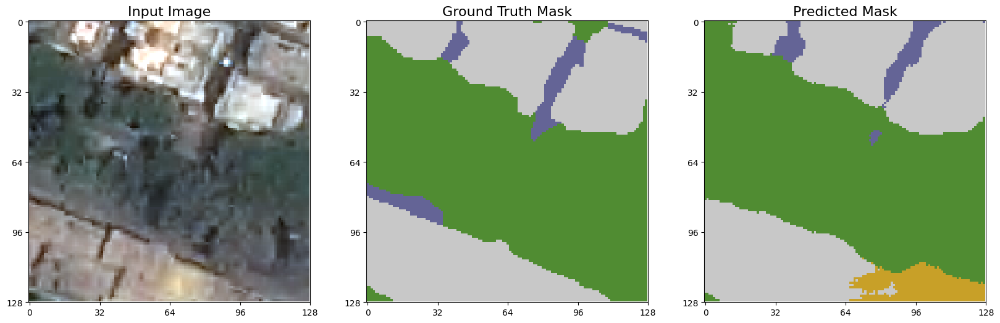

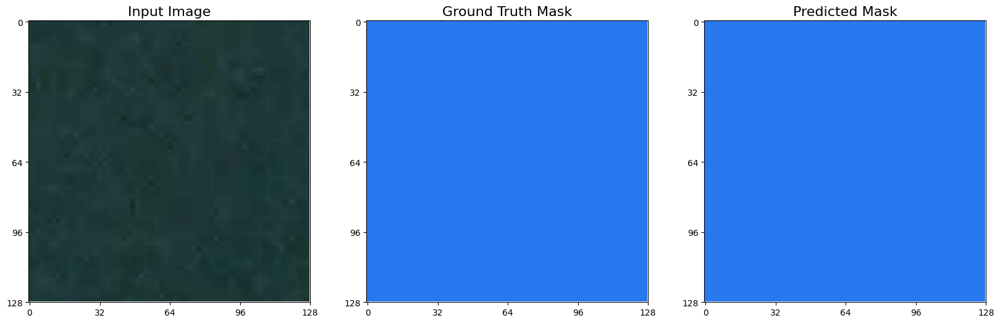

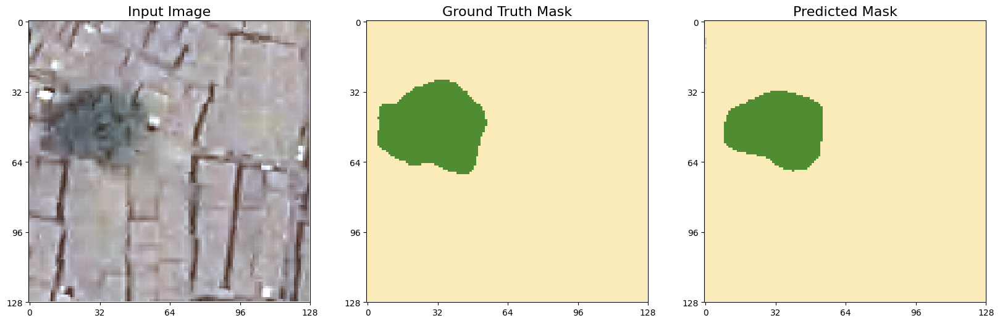

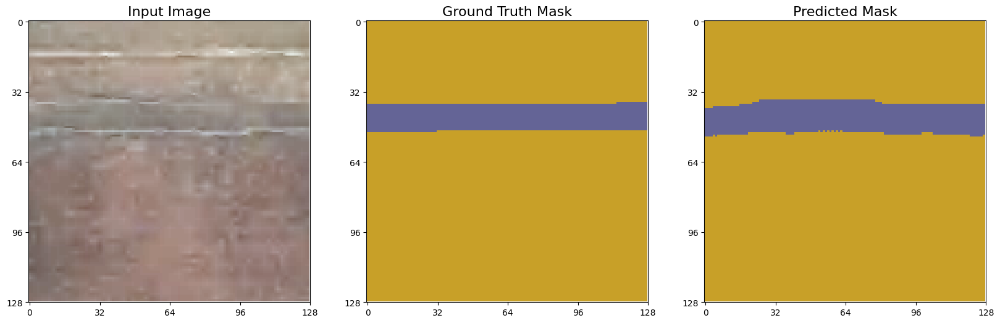

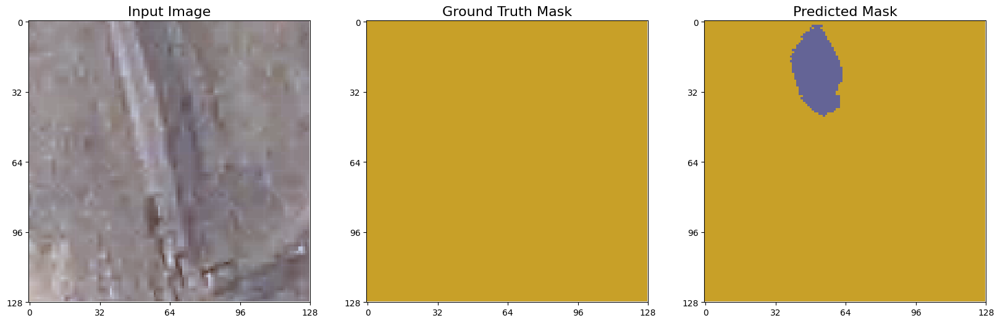

...

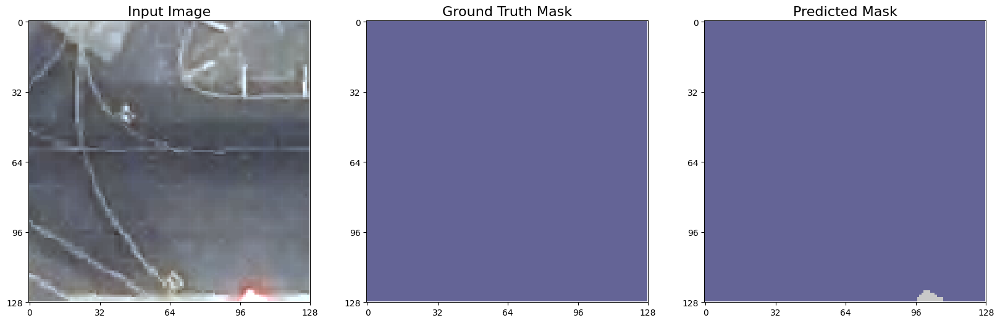

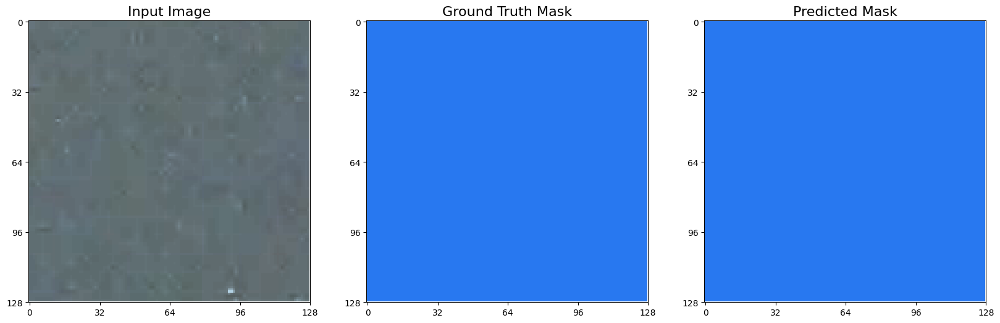

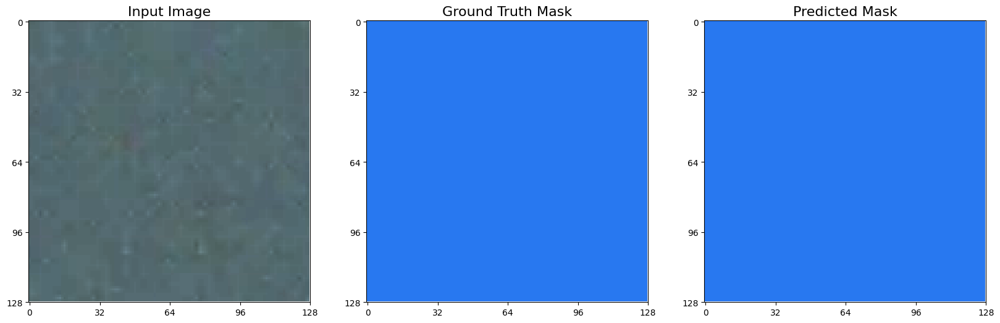

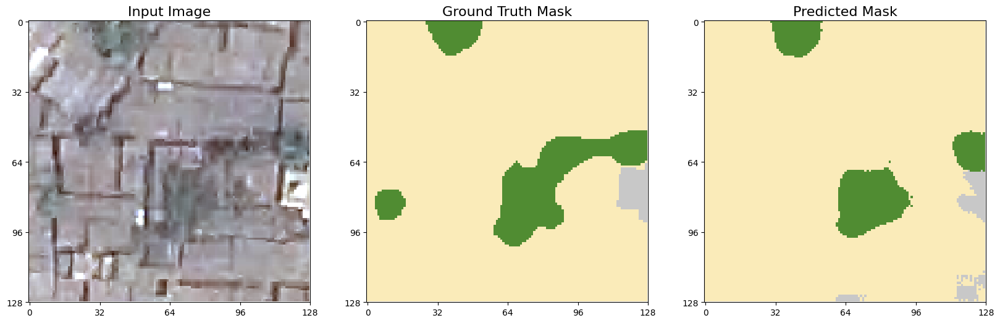

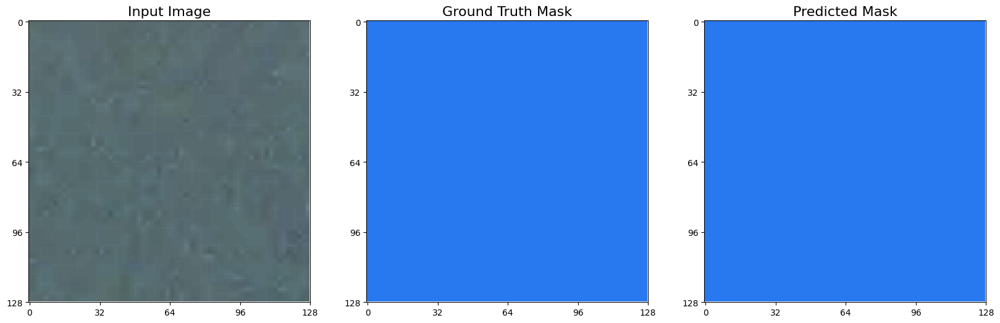

In [9]:
import os
import numpy as np
import pandas as pd
import albumentations as A
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageFont
from collections import defaultdict
import random, shutil, cv2
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.regularizers import l2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16, DenseNet121, InceptionResNetV2, VGG19, ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, CSVLogger, LearningRateScheduler, TensorBoard
from tensorflow.keras.layers import *

# Data directories - ADJUST THESE TO YOUR ACTUAL DIRECTORY STRUCTURE
data_dir = "/kaggle/input/sdsa-dse-406-606-demo-data/"  #Example path you should modify for your dataset
train_images = f"{data_dir}train_images/"
train_masks = f"{data_dir}train_masks/"
val_images = f"{data_dir}val_images/"
val_masks = f"{data_dir}val_masks/"
test_images = f"{data_dir}test_images/"
test_masks = f"{data_dir}test_masks/"

print('Number of images in training set: ', len(os.listdir(train_images+'train')))
print('Number of masks in training set: ', len(os.listdir(train_masks+'train')))

print('Number of images in testing set: ', len(os.listdir(test_images+'test')))
print('Number of masks in testing set: ', len(os.listdir(test_masks+'test')))

class_dict_df = pd.read_csv(f'{data_dir}class_dict.csv', index_col=False, skipinitialspace=True)
class_dict_df

label_names= list(class_dict_df.name)
label_codes = []
r= np.asarray(class_dict_df.r)
g= np.asarray(class_dict_df.g)
b= np.asarray(class_dict_df.b)

for i in range(len(class_dict_df)):
    label_codes.append(tuple([r[i], g[i], b[i]]))
    
label_codes, label_names

code2id = {v:k for k,v in enumerate(label_codes)}
id2code = {k:v for k,v in enumerate(label_codes)}

name2id = {v:k for k,v in enumerate(label_names)}
id2name = {k:v for k,v in enumerate(label_names)}

def rgb_to_onehot(rgb_image, colormap = id2code):
    '''Function to one hot encode RGB mask labels
        Inputs: 
            rgb_image - image matrix (eg. 256 x 256 x 3 dimension numpy ndarray)
            colormap - dictionary of color to label id
        Output: One hot encoded image of dimensions (height x width x num_classes) where num_classes = len(colormap)
    '''
    num_classes = len(colormap)
    shape = rgb_image.shape[:2]+(num_classes,)
    encoded_image = np.zeros( shape, dtype=np.int8 )
    for i, cls in enumerate(colormap):
        encoded_image[:,:,i] = np.all(rgb_image.reshape( (-1,3) ) == colormap[i], axis=1).reshape(shape[:2])
    return encoded_image

def onehot_to_rgb(onehot, colormap = id2code):
    '''Function to decode encoded mask labels
        Inputs: 
            onehot - one hot encoded image matrix (height x width x num_classes)
            colormap - dictionary of color to label id
        Output: Decoded RGB image (height x width x 3) 
    '''
    single_layer = np.argmax(onehot, axis=-1)
    output = np.zeros( onehot.shape[:2]+(3,) )
    for k in colormap.keys():
        output[single_layer==k] = colormap[k]
    return np.uint8(output)

# Normalizing only frame images, since masks contain label info
data_gen_args = dict(rescale=1./255)
mask_gen_args = dict()

train_frames_datagen = ImageDataGenerator(**data_gen_args)
train_masks_datagen = ImageDataGenerator(**mask_gen_args)
val_frames_datagen = ImageDataGenerator(**data_gen_args)
val_masks_datagen = ImageDataGenerator(**mask_gen_args)
test_frames_datagen = ImageDataGenerator(**data_gen_args)
test_masks_datagen = ImageDataGenerator(**mask_gen_args)

# Seed defined for aligning images and their masks
seed = 1

TARGET_SIZE = (128, 128) # Define a constant for target size
BATCH_SIZE = 32

def TrainAugmentGenerator(train_images_dir, train_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = TARGET_SIZE):
    '''Train Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            train_images_dir - train images directory
            train_masks_dir - train masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    train_image_generator = train_frames_datagen.flow_from_directory(
    train_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size,
    class_mode=None) # Added class_mode=None

    train_mask_generator = train_masks_datagen.flow_from_directory(
    train_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size,
    class_mode=None) # Added class_mode=None

    while True:
        X1i = next(train_image_generator)
        X2i = next(train_mask_generator)
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])]
        
        yield X1i, np.asarray(mask_encoded)

def ValAugmentGenerator(val_images_dir, val_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = TARGET_SIZE):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            val_images_dir - validation images directory
            val_masks_dir - validation masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    val_image_generator = val_frames_datagen.flow_from_directory(
    val_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size,
    class_mode=None) # Added class_mode=None


    val_mask_generator = val_masks_datagen.flow_from_directory(
    val_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size,
    class_mode=None) # Added class_mode=None


    while True:
        X1i = next(val_image_generator)
        X2i = next(val_mask_generator)
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])]
        
        yield X1i, np.asarray(mask_encoded)

        
def TestAugmentGenerator(test_images_dir, test_masks_dir, seed = 1, batch_size = BATCH_SIZE, target_size = TARGET_SIZE):
    '''Validation Image data generator
        Inputs: 
            seed - seed provided to the flow_from_directory function to ensure aligned data flow
            batch_size - number of images to import at a time
            test_images_dir - testing images directory
            test_masks_dir - testing masks directory
            target_size - tuple of integers (height, width)
            
        Output: Decoded RGB image (height x width x 3) 
    '''
    test_image_generator = test_frames_datagen.flow_from_directory(
    test_images_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size,
    class_mode=None) # Added class_mode=None


    test_mask_generator = test_masks_datagen.flow_from_directory(
    test_masks_dir,
    batch_size = batch_size, 
    seed = seed, 
    target_size = target_size,
    class_mode=None) # Added class_mode=None


    while True:
        X1i = next(test_image_generator)
        X2i = next(test_mask_generator)
        
        #One hot encoding RGB images
        mask_encoded = [rgb_to_onehot(X2i[x,:,:,:], id2code) for x in range(X2i.shape[0])]
        
        yield X1i, np.asarray(mask_encoded)

batch_size = 32
num_train_samples = len(np.sort(os.listdir(train_images+'train')))
num_val_samples = len(np.sort(os.listdir(val_images+'val')))
steps_per_epoch = int(np.ceil(float(num_train_samples) / float(batch_size)))
print('steps_per_epoch: ', steps_per_epoch)
validation_steps = int(np.ceil(float(2 * num_val_samples) / float(batch_size)))
print('validation_steps: ', validation_steps)


def dice_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    return (2. * K.sum(y_true * y_pred) + 1.) / (K.sum(y_true) + K.sum(y_pred) + 1.)

def conv_block(input, num_filters):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

def decoder_block(input, skip_features, num_filters):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters)
    return x

def build_resnet_unet(input_shape, num_classes):
    """ Input """
    inputs = Input(input_shape)

    """ Pre-trained ResNet50 Model """
    resnet = applications.ResNet50(include_top=False, weights="imagenet", input_tensor=inputs)

    """ Encoder """
    s1 = resnet.get_layer("conv1_relu").output           # 64x64x64
    s2 = resnet.get_layer("conv2_block3_out").output     # 32x32x256
    s3 = resnet.get_layer("conv3_block4_out").output     # 16x16x512
    s4 = resnet.get_layer("conv4_block6_out").output     # 8x8x1024

    """ Bridge """
    b1 = resnet.get_layer("conv5_block3_out").output     # 4x4x2048

    """ Decoder """
    d1 = decoder_block(b1, s4, 512)                      # 8x8x512
    d2 = decoder_block(d1, s3, 256)                      # 16x16x256
    d3 = decoder_block(d2, s2, 128)                      # 32x32x128
    d4 = decoder_block(d3, s1, 64)                       # 64x64x64

    """ Upsampling to original size """
    u = Conv2DTranspose(32, (2, 2), strides=2, padding="same")(d4)  # 128x128x32
    u = conv_block(u, 32)

    """ Dropout """
    x1 = Dropout(0.4)(u)
    
    """ Output """
    outputs = Conv2D(num_classes, 1, padding="same", activation="sigmoid")(x1)

    model = Model(inputs, outputs, name="ResNet50_U-Net")
    return model

K.clear_session()

resnet_unet = build_resnet_unet(input_shape = (128, 128, 3), num_classes = 7)
resnet_unet.compile(optimizer=Adam(learning_rate = 0.0001), loss='categorical_crossentropy', metrics=[dice_coef, "accuracy"])
#resnet_unet.summary()

def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1 **(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(0.0001, 40)

lr_scheduler = LearningRateScheduler(
    exponential_decay_fn,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath = 'resnet_unet.keras',
    save_best_only = True, 
#     save_weights_only = False,
    monitor = 'val_loss', 
    mode = 'auto', 
    verbose = 1
)

csvlogger = CSVLogger(
    filename= "resnet_unet_training.csv",
    separator = ",",
    append = False
)

callbacks = [checkpoint, csvlogger, lr_scheduler]

history_1 = resnet_unet.fit(
    TrainAugmentGenerator(train_images_dir = train_images, train_masks_dir = train_masks, target_size = (128, 128)), 
    steps_per_epoch = steps_per_epoch,
    validation_data = ValAugmentGenerator(val_images_dir = val_images, val_masks_dir = val_masks, target_size = (128, 128)), 
    validation_steps = validation_steps, 
    epochs = 20,
    callbacks= callbacks,
    verbose = 1
)

fig, ax = plt.subplots(2, 2, figsize=(20, 12))
ax = ax.ravel()
metrics = ['Dice Coefficient', 'Accuracy', 'Loss', 'Learning Rate']

for i, met in enumerate(['dice_coef', 'accuracy', 'loss', 'lr']):
        if met != 'lr':
            ax[i].plot(history.history[met], '-')
            ax[i].plot(history.history['val_' + met], '-')
            ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
            ax[i].set_xlabel('Epochs')
            ax[i].set_ylabel(metrics[i])
            ax[i].legend(['Train', 'Validation'])
            ax[i].xaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
            ax[i].yaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
        else:
            # Calculate learning rates from your exponential decay function
            lrs = [exponential_decay(0.0001, 40)(epoch) for epoch in range(len(history.history['loss']))]
            ax[i].plot(lrs, '-')
            ax[i].set_title('{} vs Epochs'.format(metrics[i]), fontsize=16)
            ax[i].set_xlabel('Epochs')
            ax[i].set_ylabel(metrics[i])
            ax[i].xaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")
            ax[i].yaxis.grid(True, color="lightgray", linewidth="0.8", linestyle="-")

plt.savefig('resnet_unet_metrics_plot.png', facecolor= 'w',transparent= False, bbox_inches= 'tight', dpi= 300)

testing_gen = TestAugmentGenerator(test_images_dir = test_images, test_masks_dir = test_masks, batch_size=32, target_size=(128, 128))

resnet_unet.load_weights("./resnet_unet.keras")
resnet_unet_eval = resnet_unet.evaluate(testing_gen, steps=16, return_dict=True)

!mkdir predictions

count = 0
for i in range(4):
    batch_img,batch_mask = next(testing_gen)
    pred_all = resnet_unet.predict(batch_img)
    np.shape(pred_all)
    
    for j in range(0,np.shape(pred_all)[0]):
        count += 1
        fig = plt.figure(figsize=(20,8))

        ax1 = fig.add_subplot(1,3,1)
        ax1.imshow(batch_img[j])
        ax1.set_title('Input Image', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax1.set_xticks(np.arange(0, 129, 32))
        ax1.set_yticks(np.arange(0, 129, 32))
        ax1.grid(False)

        ax2 = fig.add_subplot(1,3,2)
        ax2.set_title('Ground Truth Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax2.imshow(onehot_to_rgb(batch_mask[j],id2code))
        ax2.set_xticks(np.arange(0, 129, 32))
        ax2.set_yticks(np.arange(0, 129, 32))
        ax2.grid(False)

        ax3 = fig.add_subplot(1,3,3)
        ax3.set_title('Predicted Mask', fontdict={'fontsize': 16, 'fontweight': 'medium'})
        ax3.imshow(onehot_to_rgb(pred_all[j],id2code))
        ax3.set_xticks(np.arange(0, 129, 32))
        ax3.set_yticks(np.arange(0, 129, 32))
        ax3.grid(False)

        plt.savefig('./predictions/resnet_unet_prediction_{}.png'.format(count), facecolor= 'w', transparent= False, bbox_inches= 'tight', dpi= 200)
        plt.show()